In [ ]:
from __future__ import annotations
from pathlib import Path
import pandas as pd

def print_points_from_availability(
    csv_path: str | Path = "../dataset_clean/00meta_data/02data_availability.csv",
    resolution_seconds: int = 5,
    print_totals: bool = True,
):
    """
    For each row (machine, measurement, year, availability), print the number of data points
    present in the file, assuming a uniform sampling interval (default 5 s).
    Also prints final totals: number of files (rows) and sum of available data points.

    Returns
    -------
    df : pd.DataFrame
        Input with added columns ['expected_points','available_points'].
    totals : dict
        {
          'total_files': int,                    # number of rows in the CSV
          'total_valid_files': int,              # rows with non-null availability
          'sum_available_points': int,           # sum of available_points (NaN treated as 0)
          'sum_expected_points': int             # sum of expected_points (valid rows)
        }
    """
    csv_path = Path(csv_path)

    # Read only needed columns; ignore any unnamed index column.
    df = pd.read_csv(csv_path, usecols=lambda c: c in {"machine", "measurement", "year", "availability"})

    # Coerce types safely
    df["year"] = pd.to_numeric(df["year"], errors="coerce").astype("Int64")
    df["availability"] = pd.to_numeric(df["availability"], errors="coerce")

    # Expected samples in a UTC year at given resolution (handles leap years)
    def expected_points_for_year(y: int) -> int:
        start = pd.Timestamp(f"{int(y)}-01-01 00:00:00", tz="UTC")
        end   = pd.Timestamp(f"{int(y)+1}-01-01 00:00:00", tz="UTC")
        seconds = int((end - start).total_seconds())
        return seconds // resolution_seconds

    df["expected_points"] = df["year"].apply(
        lambda y: expected_points_for_year(int(y)) if pd.notna(y) else pd.NA
    )
    # Available points = availability * expected (rounded to nearest int)
    df["available_points"] = (df["availability"] * df["expected_points"]).round()

    # Print per file
    for row in df.itertuples(index=False):
        mach, meas, yr, avail, exp_pts, have_pts = row
        if pd.isna(exp_pts) or pd.isna(avail):
            print(f"{mach}/{meas}/{yr}: unavailable (missing availability or year)")
        else:
            print(f"{mach}/{meas}/{yr}: {int(have_pts):,} points " f"(availability {float(avail):.2%} of expected {int(exp_pts):,} @ {resolution_seconds}s)")

    # Totals
    total_files = int(len(df))
    valid_mask = df["availability"].notna() & df["expected_points"].notna()
    total_valid_files = int(valid_mask.sum())
    sum_available_points = int(df.loc[valid_mask, "available_points"].fillna(0).sum())
    sum_expected_points = int(df.loc[valid_mask, "expected_points"].sum())

    if print_totals:
        print("\n=== Totals ===")
        print(f"Files (rows): {total_files}  |  Valid files: {total_valid_files}")
        print(f"Sum of available points: {sum_available_points:,}")
        print(f"Sum of expected points:  {sum_expected_points:,}")

    totals = {
        "total_files": total_files,
        "total_valid_files": total_valid_files,
        "sum_available_points": sum_available_points,
        "sum_expected_points": sum_expected_points,
    }

    return df, totals

# Example:
df_out, totals = print_points_from_availability("../dataset_clean/00meta_data/02data_availability.csv", resolution_seconds=5)


EPI_ChipPress/Freq/2018: 5,640,235 points (availability 89.43% of expected 6,307,200 @ 5s)
EPI_ChipPress/Freq/2019: 4,295,049 points (availability 68.10% of expected 6,307,200 @ 5s)
EPI_ChipPress/Freq/2020: 4,501,229 points (availability 71.17% of expected 6,324,480 @ 5s)
EPI_ChipPress/Freq/2021: 4,544,239 points (availability 72.05% of expected 6,307,200 @ 5s)
EPI_ChipPress/Freq/2022: 5,007,829 points (availability 79.40% of expected 6,307,200 @ 5s)
EPI_ChipPress/Freq/2023: 4,519,970 points (availability 71.66% of expected 6,307,200 @ 5s)
EPI_ChipPress/Freq/2024: 4,770,171 points (availability 75.42% of expected 6,324,480 @ 5s)
EPI_ChipPress/I1/2018: 5,640,235 points (availability 89.43% of expected 6,307,200 @ 5s)
EPI_ChipPress/I1/2019: 4,295,049 points (availability 68.10% of expected 6,307,200 @ 5s)
EPI_ChipPress/I1/2020: 4,501,229 points (availability 71.17% of expected 6,324,480 @ 5s)
EPI_ChipPress/I1/2021: 4,544,239 points (availability 72.05% of expected 6,307,200 @ 5s)
EPI_Chi

In [39]:
from __future__ import annotations
from pathlib import Path
import pandas as pd

def print_points_from_availability(
    csv_path: str | Path = "../dataset_clean/00meta_data/02data_availability.csv",
    resolution_seconds: int = 5,
    print_totals: bool = True,
    print_per_machine: bool = True,   # NEW: toggle per-machine summary
):
    """
    For each row (machine, measurement, year, availability), print the number of data points
    present in the file, assuming a uniform sampling interval (default 5 s).
    Also prints final totals and (optionally) per-machine sums of valid data points.

    Returns
    -------
    df : pd.DataFrame
        Input with added columns ['expected_points','available_points'].
    totals : dict
        {
          'total_files': int,
          'total_valid_files': int,
          'sum_available_points': int,
          'sum_expected_points': int
        }
    """
    csv_path = Path(csv_path)

    # Read only needed columns; ignore any unnamed index column.
    df = pd.read_csv(csv_path, usecols=lambda c: c in {"machine", "measurement", "year", "availability"})

    # Coerce types safely
    df["year"] = pd.to_numeric(df["year"], errors="coerce").astype("Int64")
    df["availability"] = pd.to_numeric(df["availability"], errors="coerce")

    # Expected samples in a UTC year at given resolution (handles leap years)
    def expected_points_for_year(y: int) -> int:
        start = pd.Timestamp(f"{int(y)}-01-01 00:00:00", tz="UTC")
        end   = pd.Timestamp(f"{int(y)+1}-01-01 00:00:00", tz="UTC")
        seconds = int((end - start).total_seconds())
        return seconds // resolution_seconds

    df["expected_points"] = df["year"].apply(
        lambda y: expected_points_for_year(int(y)) if pd.notna(y) else pd.NA
    )

    # Available points = availability * expected (rounded to nearest int)
    df["available_points"] = (df["availability"] * df["expected_points"]).round()

    # Print per file
    for row in df.itertuples(index=False):
        mach, meas, yr, avail, exp_pts, have_pts = row
        if pd.isna(exp_pts) or pd.isna(avail):
            print(f"{mach}/{meas}/{yr}: unavailable (missing availability or year)")
        else:
            print(
                f"{mach}/{meas}/{yr}: {int(have_pts):,} points "
                f"(availability {float(avail):.2%} of expected {int(exp_pts):,} @ {resolution_seconds}s)"
            )

    # Valid rows mask (both availability and expected points present)
    valid_mask = df["availability"].notna() & df["expected_points"].notna()

    # NEW: Per-machine sum of valid data points
    if print_per_machine:
        per_machine = (
            df.loc[valid_mask]
              .groupby("machine", dropna=False)["available_points"]
              .sum()
              .astype("int64")
              .sort_values(ascending=False)
        )
        print("\n=== Per-machine sum of valid data points ===")
        for mach, pts in per_machine.items():
            print(f"{mach}: {pts:,}")

    # Totals
    total_files = int(len(df))
    total_valid_files = int(valid_mask.sum())
    sum_available_points = int(df.loc[valid_mask, "available_points"].fillna(0).sum())
    sum_expected_points  = int(df.loc[valid_mask, "expected_points"].sum())

    if print_totals:
        print("\n=== Totals ===")
        print(f"Files (rows): {total_files}  |  Valid files: {total_valid_files}")
        print(f"Sum of available points: {sum_available_points:,}")
        print(f"Sum of expected points:  {sum_expected_points:,}")

    totals = {
        "total_files": total_files,
        "total_valid_files": total_valid_files,
        "sum_available_points": sum_available_points,
        "sum_expected_points": sum_expected_points,
    }

    return df, totals

# Example:
df_out, totals = print_points_from_availability(
    "../dataset_clean/00meta_data/02data_availability.csv",
    resolution_seconds=5,
    print_per_machine=True
)


EPI_ChipPress/Freq/2018: 5,640,235 points (availability 89.43% of expected 6,307,200 @ 5s)
EPI_ChipPress/Freq/2019: 4,295,049 points (availability 68.10% of expected 6,307,200 @ 5s)
EPI_ChipPress/Freq/2020: 4,501,229 points (availability 71.17% of expected 6,324,480 @ 5s)
EPI_ChipPress/Freq/2021: 4,544,239 points (availability 72.05% of expected 6,307,200 @ 5s)
EPI_ChipPress/Freq/2022: 5,007,829 points (availability 79.40% of expected 6,307,200 @ 5s)
EPI_ChipPress/Freq/2023: 4,519,970 points (availability 71.66% of expected 6,307,200 @ 5s)
EPI_ChipPress/Freq/2024: 4,770,171 points (availability 75.42% of expected 6,324,480 @ 5s)
EPI_ChipPress/I1/2018: 5,640,235 points (availability 89.43% of expected 6,307,200 @ 5s)
EPI_ChipPress/I1/2019: 4,295,049 points (availability 68.10% of expected 6,307,200 @ 5s)
EPI_ChipPress/I1/2020: 4,501,229 points (availability 71.17% of expected 6,324,480 @ 5s)
EPI_ChipPress/I1/2021: 4,544,239 points (availability 72.05% of expected 6,307,200 @ 5s)
EPI_Chi

In [3]:
# 1.) LIST with all unique measurements
from pathlib import Path

from pathlib import Path

def _norm_empty(name: str) -> str:
    """Strip a single trailing '_EMPTY' suffix from a measurement name."""
    return name[:-6] if name.endswith("_EMPTY") else name

def unique_measurements_from_validation_results(base_dir: Path) -> list[str]:
    """
    validation_results/<MACHINE>/<MEASUREMENT>/<YEAR>_<MEASUREMENT>_stats.csv
    - Normalize possible trailing '_EMPTY' to include the base measurement name.
    """
    base_dir = Path(base_dir)
    measurements = set()
    for fp in base_dir.rglob("*_stats.csv"):
        try:
            rel = fp.relative_to(base_dir)
        except Exception:
            continue
        parts = rel.parts
        if len(parts) < 3:
            continue
        measurement = _norm_empty(parts[1])  # <MEASUREMENT>
        measurements.add(measurement)
    return sorted(measurements)

def unique_measurements_from_dataset_clean(base_dir: Path) -> list[str]:
    """
    dataset_clean/<MACHINE>/<MEASUREMENT or MEASUREMENT_EMPTY>/<YEAR>_<MEASUREMENT or MEASUREMENT_EMPTY>.csv.xz

    Updated behavior:
      - INCLUDE measurements whose folder or files end with '_EMPTY', but
        return them WITHOUT the suffix, e.g., 'Angle_U1_f_EMPTY' -> 'Angle_U1_f'.
      - Include a measurement if the directory exists and contains at least one
        '*.csv.xz' file (whether empty-marked or not).
    """
    base_dir = Path(base_dir)
    measurements = set()

    for machine_dir in base_dir.iterdir():
        if not machine_dir.is_dir():
            continue

        for meas_dir in machine_dir.iterdir():
            if not meas_dir.is_dir():
                continue

            meas_name = _norm_empty(meas_dir.name)

            # Include if the directory has any CSV.XZ files (even if stems contain '_EMPTY')
            has_any_files = any(meas_dir.glob("*.csv.xz"))
            if has_any_files:
                measurements.add(meas_name)
                continue

            # Optional fallback: if no files found but folder name existed, you may choose to skip.
            # (Left intentionally conservative: don't add if truly no files.)

    return sorted(measurements)


def diff_measurement_columns(cols_clean, cols_validation):
    """
    Return differences between two column name collections.

    Args:
        cols_clean: iterable of column names from Dataset Clean
        cols_validation: iterable of column names from Validation Results

    Returns:
        dict with:
          - only_in_validation: sorted list
          - only_in_clean: sorted list
          - in_both: sorted list
          - symmetric_diff: sorted list (union of the first two)
    """
    set_c = set(cols_clean)
    set_v = set(cols_validation)

    only_in_validation = sorted(set_v - set_c)
    only_in_clean = sorted(set_c - set_v)
    in_both = sorted(set_c & set_v)
    symmetric_diff = sorted((set_v ^ set_c))

    # Pretty print summary
    print("=== Column Comparison Summary ===")
    print(f"Clean count:       {len(set_c)}")
    print(f"Validation count:  {len(set_v)}")
    print(f"In both:           {len(in_both)}")
    print(f"Only in Clean:     {len(only_in_clean)}")
    print(f"Only in Validation:{len(only_in_validation)}\n")

    if only_in_clean:
        print("— Only in Clean —")
        print(only_in_clean, "\n")

    if only_in_validation:
        print("— Only in Validation —")
        print(only_in_validation, "\n")

    return {
        "only_in_validation": only_in_validation,
        "only_in_clean": only_in_clean,
        "in_both": in_both,
        "symmetric_diff": symmetric_diff,
    }

# --- Example wiring to your existing code ---
if __name__ == "__main__":
    vr_base = Path("../dataset_clean_validation")
    dc_base = Path("../dataset_clean")

    measurements_validation_results = unique_measurements_from_validation_results(vr_base)
    measurements_dataset_clean = unique_measurements_from_dataset_clean(dc_base)

    print("Validation Results: ", len(measurements_validation_results))
    print("Dataset Clean: ", len(measurements_dataset_clean))
    print("Dataset C: ", measurements_dataset_clean)
    print("Dataset V: ", measurements_validation_results)

    diffs = diff_measurement_columns(
        measurements_dataset_clean,
        measurements_validation_results,
    )

Validation Results:  257
Dataset Clean:  257
Dataset C:  ['AC_ActivePower', 'Angle_U1', 'Angle_U1_f', 'Angle_U2', 'Angle_U2_f', 'Angle_U3', 'Angle_U3_f', 'DailyYield', 'Freq', 'Freq_f', 'I1', 'I1_f', 'I1_h11', 'I1_h13', 'I1_h15', 'I1_h17', 'I1_h19', 'I1_h2', 'I1_h21', 'I1_h23', 'I1_h25', 'I1_h27', 'I1_h29', 'I1_h3', 'I1_h31', 'I1_h4', 'I1_h5', 'I1_h7', 'I1_h9', 'I2', 'I2_f', 'I2_h11', 'I2_h13', 'I2_h15', 'I2_h17', 'I2_h19', 'I2_h2', 'I2_h21', 'I2_h23', 'I2_h25', 'I2_h27', 'I2_h29', 'I2_h3', 'I2_h31', 'I2_h4', 'I2_h5', 'I2_h7', 'I2_h9', 'I3', 'I3_f', 'I3_h11', 'I3_h13', 'I3_h15', 'I3_h17', 'I3_h19', 'I3_h2', 'I3_h21', 'I3_h23', 'I3_h25', 'I3_h27', 'I3_h29', 'I3_h3', 'I3_h31', 'I3_h4', 'I3_h5', 'I3_h7', 'I3_h9', 'IN', 'IN_f', 'IN_h11', 'IN_h13', 'IN_h15', 'IN_h17', 'IN_h19', 'IN_h2', 'IN_h21', 'IN_h23', 'IN_h25', 'IN_h27', 'IN_h29', 'IN_h3', 'IN_h31', 'IN_h4', 'IN_h5', 'IN_h7', 'IN_h9', 'I_sys', 'I_sys_f', 'LoadType1', 'LoadType1_f', 'LoadType2', 'LoadType2_f', 'LoadType3', 'LoadType3_f'

In [4]:
# 2.) Define Measurement Limits
import pandas as pd
from math import sqrt
from collections.abc import Iterable

def build_limits_dfs(
    machine_specs: dict,
    *,
    same_limits_dict: dict | None = None,
    same_limits_items: list[tuple[tuple[float,float], Iterable[str]]] | None = None,
    safety_margin: float = 1.1,
    min_val: float = 0.0,
    vll_3p: float = 400.0,
    vll_1p: float = 230.0,
    print_info: bool = True,
) -> tuple[pd.DataFrame, pd.DataFrame | None]:
    """
    Returns:
      limits_df : DataFrame (index=machines, columns=measurements, values=(min,max))
      global_df : DataFrame (index=['ALL_MACHINES'], columns=ALL global measurements, values=(min,max))
                  or None if no global limits were provided.

    Pass *either*:
      - same_limits_items: [ ((min,max), [name,...]), ... ]   # preserves duplicates
      - same_limits_dict : { (min,max): [name,...], ... }     # duplicates in a dict literal are overwritten!
    """
    rt3 = sqrt(3)

    # ---- per-machine DF column layout ----
    CUR_PER_PHASE = ("I1","I1_f","I2","I2_f","I3","I3_f","IN","IN_f")
    CUR_SYSTEM    = ("I_sys","I_sys_f")

    def _phase_cols(prefix: str):
        return (f"{prefix}1", f"{prefix}1_f",
                f"{prefix}2", f"{prefix}2_f",
                f"{prefix}3", f"{prefix}3_f")

    POW_PHASE_S = _phase_cols("S")
    POW_PHASE_P = _phase_cols("P")
    POW_PHASE_Q = _phase_cols("Q")
    POW_TOTAL   = ("S_total","S_total_f","P_total","P_total_f","Q_total","Q_total_f")

    columns = [*CUR_PER_PHASE, *CUR_SYSTEM, *POW_PHASE_S, *POW_PHASE_P, *POW_PHASE_Q, *POW_TOTAL]

    # ---- per-machine DF ----
    limits_df = pd.DataFrame(index=list(machine_specs.keys()), columns=columns, dtype=object)
    for machine, (ph, I) in machine_specs.items():
        is3p = str(ph).upper().startswith("3P")
        I = float(I)

        cap_Ip = round(safety_margin * I, 6)
        cap_Is = round(safety_margin * (rt3 * I if is3p else I), 6)

        if is3p:
            cap_total = round(safety_margin * rt3 * vll_3p * I, 6)
            cap_phase = round(safety_margin * (vll_3p / rt3) * I, 6)
        else:
            cap_total = round(safety_margin * vll_1p * I, 6)
            cap_phase = cap_total

        for c in CUR_PER_PHASE: limits_df.at[machine, c] = (min_val, cap_Ip)
        for c in CUR_SYSTEM:    limits_df.at[machine, c] = (min_val, cap_Is)

        # Power per-phase:
        #   S*  -> [0, +max]
        #   P*, Q* -> [-max, +max]
        for c in POW_PHASE_S:
            limits_df.at[machine, c] = (0.0, cap_phase)
        for c in (*POW_PHASE_P, *POW_PHASE_Q):
            limits_df.at[machine, c] = (-cap_phase, cap_phase)

        # Power totals:
        #   S_total*  -> [0, +max]
        #   P_total*, Q_total* -> [-max, +max]
        for c in ("S_total", "S_total_f"):
            limits_df.at[machine, c] = (0.0, cap_total)
        for c in ("P_total", "P_total_f", "Q_total", "Q_total_f"):
            limits_df.at[machine, c] = (-cap_total, cap_total)

    # ---- global DF (flatten with FULL preservation) ----
    global_df = None
    flat_pairs: list[tuple[str, tuple[float,float]]] = []

    if same_limits_items:  # preferred: preserves duplicates by design
        for (mn, mx), names in same_limits_items:
            lim = (float(mn), float(mx))
            for n in names:
                flat_pairs.append((str(n), lim))
    elif same_limits_dict:  # OK if keys are unique; duplicates already overwritten upstream
        for key, names in same_limits_dict.items():
            if not (isinstance(key, tuple) and len(key) == 2):
                raise TypeError("same_limits_dict must have (min,max) tuple keys.")
            lim = (float(key[0]), float(key[1]))
            for n in names:
                flat_pairs.append((str(n), lim))

    if flat_pairs:
        cols = [n for n, _ in flat_pairs]  # keep order; allow duplicates, last wins for same name
        global_df = pd.DataFrame(index=["ALL_MACHINES"], columns=cols, dtype=object)
        for n, lim in flat_pairs:
            global_df.at["ALL_MACHINES", n] = lim

    if print_info:
        print(
            "Limits calculation:\n"
            f"  safety_margin M = {safety_margin}, min_val = {min_val}\n"
            f"  voltages: V_LL_3P = {vll_3p} V, V_1P = {vll_1p} V\n"
            "  Current per-phase (I1,I2,I3,IN,*_f):   M * I\n"
            "  Current system (I_sys,*_f):           3P -> M*√3*I   |  1P -> M*I\n"
            "  Power totals (S/P/Q _total,*_f):      3P -> M*√3*V_LL_3P*I   |  1P -> M*V_1P*I\n"
            "  Power per-phase (S/P/Q 1..3,*_f):     3P -> M*(V_LL_3P/√3)*I |  1P -> M*V_1P*I\n"
            "Note: Use same_limits_items=[((min,max), [..]), ...] to preserve duplicate (min,max) groups."
        )

    return limits_df, global_df


# Your compact machine specs (no voltages here):
MACHINE_SPECS = {
    "EPI_ChipPress": ("3P", 50.0),
    "EPI_ChipSaw": ("3P", 6.0),
    "EPI_HighTempOven": ("3P", 32.0),
    "EPI_PickAndPlace": ("1P", 5.0),
    "EPI_PumpStation1": ("3P", 34.0),
    "EPI_PumpStation2": ("3P", 36.0),
    "EPI_ScreenPrinter": ("1P", 5.2),
    "EPI_SolderOven": ("3P", 29.0),
    "EPI_TotalLoad": ("3P", 160.0),
    "EPI_VacuumSoldering": ("3P", 14.0),
    "EPI_WashingMachine": ("3P", 18.0),
    "TEC_48S": ("3P", 40.0),
    "TEC_CFST161": ("3P", 40.0),
    "TEC_CTX800TC": ("3P", 100.0),
    "TEC_Chiron800": ("3P", 90.0),
    "TEC_DMF3008": ("3P", 80.0),
    "TEC_DMU125MB": ("3P", 125.0),
    "TEC_DNG50evo": ("3P", 80.0),
    "TEC_E110": ("3P", 80.0),
    "TEC_E30D2": ("3P", 15.0),
    "TEC_JWA24": ("3P", 45.0),
    "TEC_MV2400R": ("3P", 70.0),
}

# Example: dictionary of global same-for-all limits (replace with yours)
# Preserve both (0.0,100.0) groups by listing them separately:
SAME_LIMITS_ITEMS = [
    ((49.0, 51.0), ["Freq", "Freq_f"]),
    ((-1.0, 1.0), ["LoadType1","LoadType1_f","LoadType2","LoadType2_f","LoadType3","LoadType3_f"]),
    ((-180.0, 180.0), ["Angle_U1","Angle_U1_f","Angle_U2","Angle_U2_f","Angle_U3","Angle_U3_f"]),
    ((2000.0, 25000.0), ["OpHours"]),
    # --- (0.0,100.0) VOLTAGE harmonics ---
    ((0.0, 100.0), [
        "U12_h2","U12_h3","U12_h4","U12_h5","U12_h7","U12_h9","U12_h11","U12_h13","U12_h15","U12_h17","U12_h19","U12_h21","U12_h23","U12_h25","U12_h27","U12_h29","U12_h31",
        "U1_h2","U1_h3","U1_h4","U1_h5","U1_h7","U1_h9","U1_h11","U1_h13","U1_h15","U1_h17","U1_h19","U1_h21","U1_h23","U1_h25","U1_h27","U1_h29","U1_h31",
        "U23_h2","U23_h3","U23_h4","U23_h5","U23_h7","U23_h9","U23_h11","U23_h13","U23_h15","U23_h17","U23_h19","U23_h21","U23_h23","U23_h25","U23_h27","U23_h29","U23_h31",
        "U2_h2","U2_h3","U2_h4","U2_h5","U2_h7","U2_h9","U2_h11","U2_h13","U2_h15","U2_h17","U2_h19","U2_h21","U2_h23","U2_h25","U2_h27","U2_h29","U2_h31",
        "U31_h2","U31_h3","U31_h4","U31_h5","U31_h7","U31_h9","U31_h11","U31_h13","U31_h15","U31_h17","U31_h19","U31_h21","U31_h23","U31_h25","U31_h27","U31_h29","U31_h31",
        "U3_h2","U3_h3","U3_h4","U3_h5","U3_h7","U3_h9","U3_h11","U3_h13","U3_h15","U3_h17","U3_h19","U3_h21","U3_h23","U3_h25","U3_h27","U3_h29","U3_h31",
    ]),
    # --- (0.0,100.0) CURRENT harmonics ---
    ((0.0, 100.0), [
        "I1_h2","I1_h3","I1_h4","I1_h5","I1_h7","I1_h9","I1_h11","I1_h13","I1_h15","I1_h17","I1_h19","I1_h21","I1_h23","I1_h25","I1_h27","I1_h29","I1_h31",
        "I2_h2","I2_h3","I2_h4","I2_h5","I2_h7","I2_h9","I2_h11","I2_h13","I2_h15","I2_h17","I2_h19","I2_h21","I2_h23","I2_h25","I2_h27","I2_h29","I2_h31",
        "I3_h2","I3_h3","I3_h4","I3_h5","I3_h7","I3_h9","I3_h11","I3_h13","I3_h15","I3_h17","I3_h19","I3_h21","I3_h23","I3_h25","I3_h27","I3_h29","I3_h31",
        "IN_h2","IN_h3","IN_h4","IN_h5","IN_h7","IN_h9","IN_h11","IN_h13","IN_h15","IN_h17","IN_h19","IN_h21","IN_h23","IN_h25","IN_h27","IN_h29","IN_h31",
    ]),
    ((200.9, 260.0), ['U1','U1_f','U2','U2_f','U3','U3_f','U_phase_avg','U_phase_avg_f']),
    ((350.0, 450.0), ['U12','U12_f','U23','U23_f','U31','U31_f','U_line_avg','U_line_avg_f']),
    ((-1.0, 1.0), ['RotField','RotField_f']),
    ((-1.0, 1.0), ['PF1','PF1_h','PF2','PF2_h','PF3','PF3_h','PF_total','PF_total_f']),
    ((0.0, 11000), ['AC_ActivePower']),
    ((0.0, 50000), ['DailyYield']),
    ((0.0, 100), ['THD_U1','THD_U12','THD_U2','THD_U23','THD_U3','THD_U31']),
    ((0.0, 100), ['THD_I1','THD_I2','THD_I3','THD_IN']),
]

# Build both DFs (no values are lost)
limits_df, global_df = build_limits_dfs(
    MACHINE_SPECS,
    same_limits_items=SAME_LIMITS_ITEMS,   # << use the list form
    safety_margin=1.2,
    min_val=0.0,
    vll_3p=400.0,
    vll_1p=230.0,
    print_info=True,
)

# Optional rounded view for display
rounded_limits = limits_df.map(lambda t: (round(t[0], 1), round(t[1], 1)))
rounded_global = global_df.map(lambda t: (round(t[0], 1), round(t[1], 1)))

with pd.option_context("display.max_rows", None, "display.max_columns", None, "display.width", 0, "display.max_colwidth", None):
    print("\n=== Per-machine limits (tuples) ===")
    display(rounded_limits.head(1))
    print("\n=== Global same-for-all limits (tuples) ===")
    display(rounded_global.head(1))

Limits calculation:
  safety_margin M = 1.2, min_val = 0.0
  voltages: V_LL_3P = 400.0 V, V_1P = 230.0 V
  Current per-phase (I1,I2,I3,IN,*_f):   M * I
  Current system (I_sys,*_f):           3P -> M*√3*I   |  1P -> M*I
  Power totals (S/P/Q _total,*_f):      3P -> M*√3*V_LL_3P*I   |  1P -> M*V_1P*I
  Power per-phase (S/P/Q 1..3,*_f):     3P -> M*(V_LL_3P/√3)*I |  1P -> M*V_1P*I
Note: Use same_limits_items=[((min,max), [..]), ...] to preserve duplicate (min,max) groups.

=== Per-machine limits (tuples) ===


,I1,I1_f,I2,I2_f,I3,I3_f,IN,IN_f,I_sys,I_sys_f,S1,S1_f,S2,S2_f,S3,S3_f,P1,P1_f,P2,P2_f,P3,P3_f,Q1,Q1_f,Q2,Q2_f,Q3,Q3_f,S_total,S_total_f,P_total,P_total_f,Q_total,Q_total_f
EPI_ChipPress,"(0.0, 60.0)","(0.0, 60.0)","(0.0, 60.0)","(0.0, 60.0)","(0.0, 60.0)","(0.0, 60.0)","(0.0, 60.0)","(0.0, 60.0)","(0.0, 103.9)","(0.0, 103.9)","(0.0, 13856.4)","(0.0, 13856.4)","(0.0, 13856.4)","(0.0, 13856.4)","(0.0, 13856.4)","(0.0, 13856.4)","(-13856.4, 13856.4)","(-13856.4, 13856.4)","(-13856.4, 13856.4)","(-13856.4, 13856.4)","(-13856.4, 13856.4)","(-13856.4, 13856.4)","(-13856.4, 13856.4)","(-13856.4, 13856.4)","(-13856.4, 13856.4)","(-13856.4, 13856.4)","(-13856.4, 13856.4)","(-13856.4, 13856.4)","(0.0, 41569.2)","(0.0, 41569.2)","(-41569.2, 41569.2)","(-41569.2, 41569.2)","(-41569.2, 41569.2)","(-41569.2, 41569.2)"



=== Global same-for-all limits (tuples) ===


,Freq,Freq_f,LoadType1,LoadType1_f,LoadType2,LoadType2_f,LoadType3,LoadType3_f,Angle_U1,Angle_U1_f,Angle_U2,Angle_U2_f,Angle_U3,Angle_U3_f,OpHours,U12_h2,U12_h3,U12_h4,U12_h5,U12_h7,U12_h9,U12_h11,U12_h13,U12_h15,U12_h17,U12_h19,U12_h21,U12_h23,U12_h25,U12_h27,U12_h29,U12_h31,U1_h2,U1_h3,U1_h4,U1_h5,U1_h7,U1_h9,U1_h11,U1_h13,U1_h15,U1_h17,U1_h19,U1_h21,U1_h23,U1_h25,U1_h27,U1_h29,U1_h31,U23_h2,U23_h3,U23_h4,U23_h5,U23_h7,U23_h9,U23_h11,U23_h13,U23_h15,U23_h17,U23_h19,U23_h21,U23_h23,U23_h25,U23_h27,U23_h29,U23_h31,U2_h2,U2_h3,U2_h4,U2_h5,U2_h7,U2_h9,U2_h11,U2_h13,U2_h15,U2_h17,U2_h19,U2_h21,U2_h23,U2_h25,U2_h27,U2_h29,U2_h31,U31_h2,U31_h3,U31_h4,U31_h5,U31_h7,U31_h9,U31_h11,U31_h13,U31_h15,U31_h17,U31_h19,U31_h21,U31_h23,U31_h25,U31_h27,U31_h29,U31_h31,U3_h2,U3_h3,U3_h4,U3_h5,U3_h7,U3_h9,U3_h11,U3_h13,U3_h15,U3_h17,U3_h19,U3_h21,U3_h23,U3_h25,U3_h27,U3_h29,U3_h31,I1_h2,I1_h3,I1_h4,I1_h5,I1_h7,I1_h9,I1_h11,I1_h13,I1_h15,I1_h17,I1_h19,I1_h21,I1_h23,I1_h25,I1_h27,I1_h29,I1_h31,I2_h2,I2_h3,I2_h4,I2_h5,I2_h7,I2_h9,I2_h11,I2_h13,I2_h15,I2_h17,I2_h19,I2_h21,I2_h23,I2_h25,I2_h27,I2_h29,I2_h31,I3_h2,I3_h3,I3_h4,I3_h5,I3_h7,I3_h9,I3_h11,I3_h13,I3_h15,I3_h17,I3_h19,I3_h21,I3_h23,I3_h25,I3_h27,I3_h29,I3_h31,IN_h2,IN_h3,IN_h4,IN_h5,IN_h7,IN_h9,IN_h11,IN_h13,IN_h15,IN_h17,IN_h19,IN_h21,IN_h23,IN_h25,IN_h27,IN_h29,IN_h31,U1,U1_f,U2,U2_f,U3,U3_f,U_phase_avg,U_phase_avg_f,U12,U12_f,U23,U23_f,U31,U31_f,U_line_avg,U_line_avg_f,RotField,RotField_f,PF1,PF1_h,PF2,PF2_h,PF3,PF3_h,PF_total,PF_total_f,AC_ActivePower,DailyYield,THD_U1,THD_U12,THD_U2,THD_U23,THD_U3,THD_U31,THD_I1,THD_I2,THD_I3,THD_IN
ALL_MACHINES,"(49.0, 51.0)","(49.0, 51.0)","(-1.0, 1.0)","(-1.0, 1.0)","(-1.0, 1.0)","(-1.0, 1.0)","(-1.0, 1.0)","(-1.0, 1.0)","(-180.0, 180.0)","(-180.0, 180.0)","(-180.0, 180.0)","(-180.0, 180.0)","(-180.0, 180.0)","(-180.0, 180.0)","(2000.0, 25000.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)","(0.0, 100.0)"

In [5]:
# 3.) Check if all measurements have limits
import pandas as pd

def check_limits_coverage(
    expected_measurements: list[str],
    per_machine_df: pd.DataFrame,
    global_df: pd.DataFrame | None
) -> dict:
    """
    Compare the union of columns from per_machine_df and global_df against expected_measurements.

    Returns a dict with:
      - total_expected
      - total_in_dfs
      - covered_count
      - missing_count
      - extras_count
      - overlap_count
      - different_overlap_count
      - missing: list[str]                   # in expected but not in either DF
      - extras: list[str]                    # in DFs but not in expected
      - present: list[str]                   # in both expected and DFs
      - overlap_columns: list[str]           # columns present in both DFs
      - different_overlap: list[str]         # overlap columns where tuples differ
                                              # (global tuple != any per-machine tuple)
    Notes:
      - Assumes cells contain (min, max) tuples (object dtype).
      - If global_df is None, comparison is only against per_machine_df.
    """
    expected_set = set(expected_measurements)
    per_cols = set(per_machine_df.columns)
    glob_cols = set(global_df.columns) if global_df is not None else set()
    all_cols = per_cols | glob_cols

    missing = sorted(expected_set - all_cols)
    extras = sorted(all_cols - expected_set)
    present = sorted(expected_set & all_cols)

    overlap_columns = sorted(per_cols & glob_cols)

    different_overlap = []
    if global_df is not None and not global_df.empty:
        # global_df has a single row by contract ("ALL_MACHINES")
        grow = global_df.iloc[0]
        for col in overlap_columns:
            gval = grow[col]
            # Compare against all non-null per-machine tuples in that column
            pm_vals = per_machine_df[col].dropna().unique()
            # If any per-machine tuple differs from the global tuple, flag it
            if any(v != gval for v in pm_vals):
                different_overlap.append(col)

    report = {
        "total_expected": len(expected_set),
        "total_in_dfs": len(all_cols),
        "covered_count": len(present),
        "missing_count": len(missing),
        "extras_count": len(extras),
        "overlap_count": len(overlap_columns),
        "different_overlap_count": len(different_overlap),
        "missing": missing,
        "extras": extras,
        "present": present,
        "overlap_columns": overlap_columns,
        "different_overlap": sorted(different_overlap),
    }

    # Pretty summary
    print("=== Limits Coverage Check ===")
    print(f"Expected measurements: {report['total_expected']}")
    print(f"Columns in DFs union: {report['total_in_dfs']}")
    print(f"Covered (expected ∩ DFs): {report['covered_count']}")
    print(f"Missing (expected \\ DFs): {report['missing_count']}")
    print(f"Extras (DFs \\ expected): {report['extras_count']}")
    print(f"Overlap cols (per-machine ∩ global): {report['overlap_count']}")
    print(f"Overlap with differing tuples: {report['different_overlap_count']}")
    if report["missing"]:
        print("\n— Missing —")
        print(report["missing"])
    if report["extras"]:
        print("\n— Extras —")
        print(report["extras"])
    if report["different_overlap"]:
        print("\n— Overlap with different tuples —")
        print(report["different_overlap"])

    return report

# --- Example execution (commented out) ---
expected = measurements_dataset_clean  # your list of all measurement names
per_machine = rounded_limits           # or limits_df; columns are identical
global_same = rounded_global           # or df_global; columns are identical
results = check_limits_coverage(expected, per_machine, global_same)

=== Limits Coverage Check ===
Expected measurements: 257
Columns in DFs union: 257
Covered (expected ∩ DFs): 257
Missing (expected \ DFs): 0
Extras (DFs \ expected): 0
Overlap cols (per-machine ∩ global): 0
Overlap with differing tuples: 0


In [6]:
# 4.) Check for outliers
from pathlib import Path
import pandas as pd
from typing import Optional, Tuple, Dict, Any, List

def check_stats_files_against_limits(
    base_dir: Path,
    per_machine_df: pd.DataFrame,
    global_df: Optional[pd.DataFrame] = None,
    *,
    accept_equal: bool = True,   # True: inclusive bounds (<=, >=). False: strict (<, >)
    print_results: bool = True,
    print_invalid_only_summary: bool = True
) -> Tuple[Dict[str, Any], List[Dict[str, Any]]]:
    """
    Walks base_dir like: base_dir/<MACHINE>/<MEASUREMENT>/<YEAR>_<MEASUREMENT>_stats.csv
    Reads each *_stats.csv and checks 'min' and 'max' columns against allowed limits.

    Allowed limits resolution order:
      1) per_machine_df.at[machine, measurement] if available
      2) global_df.at['ALL_MACHINES', measurement] if available
      else -> NO_LIMIT

    Prints one line per file:
      Machine · Measurement · Allowed(min,max) · Actual(min,max) · OK/INVALID/NO_LIMIT

    Returns:
      summary: {
        'checked': int,
        'valid': int,
        'invalid': int,
        'no_limit': int,
        'details': list[dict]  # one dict per file checked
      }
      invalid_details: list[dict]  # ONLY the INVALID rows with path + values
    """
    base_dir = Path(base_dir)
    has_global = (global_df is not None) and (not global_df.empty)

    def _get_allowed(machine: str, measurement: str) -> Optional[Tuple[float, float]]:
        # per-machine first
        if (measurement in per_machine_df.columns) and (machine in per_machine_df.index):
            val = per_machine_df.at[machine, measurement]
            if isinstance(val, tuple) and len(val) == 2:
                return float(val[0]), float(val[1])
        # then global
        if has_global and (measurement in global_df.columns):
            val = global_df.at["ALL_MACHINES", measurement]
            if isinstance(val, tuple) and len(val) == 2:
                return float(val[0]), float(val[1])
        return None

    def _is_valid(actual_min: float, actual_max: float, allowed_min: float, allowed_max: float) -> bool:
        if accept_equal:
            return (allowed_min <= actual_min) and (actual_max <= allowed_max)
        else:
            return (allowed_min < actual_min) and (actual_max < allowed_max)

    results: List[Dict[str, Any]] = []
    invalid_details: List[Dict[str, Any]] = []
    n_checked = n_valid = n_invalid = n_no_limit = 0

    # Walk all stats files
    for fp in base_dir.rglob("*_stats.csv"):
        try:
            rel = fp.relative_to(base_dir)
            parts = rel.parts
            if len(parts) < 3:
                continue
            machine = parts[0]
            measurement = parts[1]
        except Exception:
            continue

        # Read the stats file (first row)
        try:
            df_stats = pd.read_csv(fp, nrows=1)
            actual_min = float(df_stats.loc[0, "min"])
            actual_max = float(df_stats.loc[0, "max"])
        except Exception as e:
            n_checked += 1
            rec = {
                "path": str(fp),
                "machine": machine,
                "measurement": measurement,
                "allowed_min": None,
                "allowed_max": None,
                "actual_min": None,
                "actual_max": None,
                "status": f"READ_ERROR: {e}",
            }
            results.append(rec)
            if print_results:
                print(f"[READ_ERROR] {fp} :: {e}")
            continue

        allowed = _get_allowed(machine, measurement)
        if allowed is None:
            status = "NO_LIMIT"
            n_no_limit += 1
            allowed_min = allowed_max = None
        else:
            allowed_min, allowed_max = allowed
            status = "OK" if _is_valid(actual_min, actual_max, allowed_min, allowed_max) else "INVALID"
            if status == "OK":
                n_valid += 1
            else:
                n_invalid += 1

        n_checked += 1
        rec = {
            "path": str(fp),
            "machine": machine,
            "measurement": measurement,
            "allowed_min": allowed_min,
            "allowed_max": allowed_max,
            "actual_min": actual_min,
            "actual_max": actual_max,
            "status": status,
        }
        results.append(rec)

        if status == "INVALID":
            invalid_details.append(rec)

        if print_results:
            # Pretty print with simple highlighting for INVALID
            if status == "INVALID":
                status_str = "❌ INVALID"
            elif status == "OK":
                status_str = "✅ OK"
            else:
                status_str = "⚠️ NO_LIMIT"

            print(
                f"{status_str} | {machine:<20} | {measurement:<18} | "
                f"allowed=({allowed_min}, {allowed_max}) | actual=({actual_min}, {actual_max}) | file={fp.name}"
            )

    summary = {
        "checked": n_checked,
        "valid": n_valid,
        "invalid": n_invalid,
        "no_limit": n_no_limit,
        "details": results,
    }

    # Final summary
    if print_results:
        print("\n=== Summary ===")
        print(f"Checked files: {n_checked}")
        print(f"Valid:         {n_valid}")
        print(f"Invalid:       {n_invalid}")
        print(f"No limit:      {n_no_limit}")

    # Optional compact invalid-only summary
    if print_invalid_only_summary and invalid_details:
        print("\n=== INVALID files (path · machine · measurement · allowed · actual) ===")
        for rec in invalid_details:
            print(
                f"{rec['path']} | {rec['machine']} · {rec['measurement']} | "
                f"allowed=({rec['allowed_min']}, {rec['allowed_max']}) | "
                f"actual=({rec['actual_min']}, {rec['actual_max']})"
            )

    return summary, invalid_details

# --- Example execution (commented out) ---
base = Path("../dataset_clean_validation")
summary, invalids = check_stats_files_against_limits(
    base_dir=base,
    per_machine_df=limits_df,     # from your build_limits_dfs()
    global_df=global_df,          # from your build_limits_dfs()
    accept_equal=True,
    print_results=True,
    print_invalid_only_summary=True,
)
# # Optional: turn the invalids list into a DataFrame for quick filtering/excel:
invalids_df = pd.DataFrame(invalids)
display(invalids_df.head())


✅ OK | EPI_ChipPress        | Freq               | allowed=(49.0, 51.0) | actual=(49.83, 50.13) | file=2018_Freq_stats.csv
✅ OK | EPI_ChipPress        | Freq               | allowed=(49.0, 51.0) | actual=(49.79, 50.16) | file=2019_Freq_stats.csv
✅ OK | EPI_ChipPress        | Freq               | allowed=(49.0, 51.0) | actual=(49.81, 50.13) | file=2020_Freq_stats.csv
✅ OK | EPI_ChipPress        | Freq               | allowed=(49.0, 51.0) | actual=(49.75, 50.14) | file=2021_Freq_stats.csv
✅ OK | EPI_ChipPress        | Freq               | allowed=(49.0, 51.0) | actual=(49.83, 50.12) | file=2022_Freq_stats.csv
✅ OK | EPI_ChipPress        | Freq               | allowed=(49.0, 51.0) | actual=(49.83, 50.15) | file=2023_Freq_stats.csv
✅ OK | EPI_ChipPress        | Freq               | allowed=(49.0, 51.0) | actual=(49.82, 50.13) | file=2024_Freq_stats.csv
✅ OK | EPI_ChipPress        | I1                 | allowed=(0.0, 60.0) | actual=(0.0, 42.091) | file=2018_I1_stats.csv
✅ OK | EPI_ChipPress

""


In [17]:
#invalids_df.to_csv('invalids_df.csv',)
with pd.option_context("display.max_rows", None, "display.max_columns", None, "display.width", 0, "display.max_colwidth", None):
    display(invalids_df.head(5))

,path,machine,measurement,allowed_min,allowed_max,actual_min,actual_max,status
0,..\dataset_clean_validation\EPI_ChipPress\PF2\2018_PF2_stats.csv,EPI_ChipPress,PF2,-1.0,1.0,-1.083,1.089,INVALID
1,..\dataset_clean_validation\EPI_ChipPress\PF2\2019_PF2_stats.csv,EPI_ChipPress,PF2,-1.0,1.0,-0.999,1.089,INVALID
2,..\dataset_clean_validation\EPI_ChipPress\PF2\2020_PF2_stats.csv,EPI_ChipPress,PF2,-1.0,1.0,-0.999,1.084,INVALID
3,..\dataset_clean_validation\EPI_ChipPress\PF2\2021_PF2_stats.csv,EPI_ChipPress,PF2,-1.0,1.0,-0.999,1.105,INVALID
4,..\dataset_clean_validation\EPI_ChipPress\PF2\2022_PF2_stats.csv,EPI_ChipPress,PF2,-1.0,1.0,-0.999,1.081,INVALID


In [ ]:
# 5.) Outlier Removal
import os
import sys
import shutil
from datetime import datetime
from pathlib import Path
from typing import Optional, Set

import numpy as np
import pandas as pd


def _derive_paths_from_stats(stats_path: Path):
    """
    Given a stats csv path like:
      ..\\dataset_clean_validation\\MACHINE\\MEASUREMENT\\YEAR_MEASUREMENT_stats.csv
    produce:
      data_path    -> ..\\dataset_clean\\MACHINE\\MEASUREMENT\\YEAR_MEASUREMENT.csv.xz
      stats_path   -> the input path
      missing_path -> ..\\dataset_clean_validation\\MACHINE\\MEASUREMENT\\YEAR_MEASUREMENT_missing.csv
    """
    stats_path = stats_path.resolve() if not stats_path.is_absolute() else stats_path
    stats_str = str(stats_path)

    # Normalize separators
    stats_str = stats_str.replace("/", os.sep).replace("\\", os.sep)

    # data path: swap base dir and suffix
    data_str = stats_str.replace(f"{os.sep}dataset_clean_validation{os.sep}",
                                 f"{os.sep}dataset_clean{os.sep}")
    if not data_str.endswith("_stats.csv"):
        raise ValueError(f"Stats path does not end with '_stats.csv': {stats_str}")
    data_str = data_str[:-10] + ".csv.xz"  # replace _stats.csv -> .csv.xz

    # missing path: swap _stats -> _missing
    missing_str = stats_str[:-10] + "_missing.csv"

    return Path(data_str), Path(stats_str), Path(missing_str)


def _pick_value_column(df: pd.DataFrame, measurement_name: Optional[str]) -> str:
    """
    Heuristic to select the value column:
      1) exact match to `measurement_name` if numeric
      2) else, first numeric column excluding common time columns
    Raises if no suitable numeric column is found.
    """
    # 1) direct match
    if measurement_name and measurement_name in df.columns:
        if pd.api.types.is_numeric_dtype(df[measurement_name]):
            return measurement_name

    # 2) first numeric non-time column
    time_like = {"time", "timestamp", "date", "datetime", "ts", "Time", "Timestamp", "Date", "Datetime"}
    numeric_cols = [c for c in df.columns if pd.api.types.is_numeric_dtype(df[c]) and c not in time_like]
    if len(numeric_cols) == 0:
        raise ValueError(f"No numeric value column found. Columns: {list(df.columns)}")
    return numeric_cols[0]


def clean_invalid_measurements(
    invalids_df: pd.DataFrame,
    test_mode: bool = True,
    replace_mode: str = "nan",
    backup_suffix: Optional[str] = None,
    verbose: bool = True,
):
    """
    Parameters
    ----------
    invalids_df : DataFrame
        Must have columns: ['path','machine','measurement','allowed_min','allowed_max',
                            'actual_min','actual_max','status'].
        'path' should point to the *_stats.csv file.
    test_mode : bool
        If True, just print what would happen and do not modify any files.
    replace_mode : str
        'nan' -> set outliers to NaN (remove),
        'clip' -> clip into [allowed_min, allowed_max].
    backup_suffix : Optional[str]
        Optional suffix for backup file. Default uses timestamp like .bak_YYYYmmdd_HHMMSS.
    verbose : bool
        Print progress info.

    Behavior
    --------
    - Derives (data_path, stats_path, missing_path) for each row.
    - In test mode: prints paths + actual_min/max (from invalids_df) and the post-change bounds.
    - In apply mode: backs up <data_path> and edits it in place according to replace_mode.
    - Skips duplicate data paths within the same call to avoid double-processing.
    """
    required_cols = {"path", "machine", "measurement", "allowed_min", "allowed_max", "actual_min", "actual_max", "status"}
    missing_cols = required_cols - set(invalids_df.columns)
    if missing_cols:
        raise ValueError(f"invalids_df missing required columns: {missing_cols}")

    if replace_mode not in {"nan", "clip"}:
        raise ValueError("replace_mode must be 'nan' or 'clip'")

    # process each unique stats path (some rows may repeat the same file)
    processed_data_paths: Set[Path] = set()
    ts = datetime.now().strftime("%Y%m%d_%H%M%S")
    default_backup_suffix = f".bak_{ts}"

    for idx, row in invalids_df.iterrows():
        try:
            stats_path_in = Path(str(row["path"]))
            data_path, stats_path, missing_path = _derive_paths_from_stats(stats_path_in)

            # print the 3 paths
            if verbose:
                print(f"\n[{idx}] MACHINE={row['machine']}  MEAS={row['measurement']}")
                print(f"  data_path   : {data_path}")
                print(f"  stats_path  : {stats_path}")
                print(f"  missing_path: {missing_path}")

            # report min/max (from df row) and intended change
            a_min, a_max = float(row["actual_min"]), float(row["actual_max"])
            lo, hi = float(row["allowed_min"]), float(row["allowed_max"])

            # planned post-change "bounds" for logging
            planned_min = max(a_min, lo) if replace_mode == "clip" else (a_min if a_min >= lo else np.nan)
            planned_max = min(a_max, hi) if replace_mode == "clip" else (a_max if a_max <= hi else np.nan)

            if verbose:
                print(f"  actual min/max: {a_min} / {a_max}")
                if replace_mode == "clip":
                    print(f"  -> after clip to [{lo}, {hi}] min/max will be within bounds "
                          f"(min→≥{lo if a_min < lo else a_min}, max→≤{hi if a_max > hi else a_max})")
                else:
                    print(f"  -> after removal (outside set to NaN) values < {lo} or > {hi} will be NaN "
                          f"(min→{planned_min}, max→{planned_max})")

            # In test mode: don't touch files
            if test_mode:
                continue

            # Avoid double-processing same data file within one run
            if data_path in processed_data_paths:
                if verbose:
                    print("  (already processed this data file in this run; skipping)")
                continue

            # Safety checks
            if not data_path.exists():
                print(f"  WARNING: data file does not exist: {data_path} — skipping")
                continue

            # Backup
            bkp_suffix = backup_suffix or default_backup_suffix
            backup_path = data_path.with_suffix(data_path.suffix + bkp_suffix)
            shutil.copy2(data_path, backup_path)
            if verbose:
                print(f"  backed up -> {backup_path}")

            # Load, fix, save
            try:
                df = pd.read_csv(data_path, compression="xz")
            except Exception as e:
                print(f"  ERROR: reading {data_path} failed: {e}")
                continue

            try:
                value_col = _pick_value_column(df, str(row["measurement"]) if pd.notna(row["measurement"]) else None)
            except Exception as e:
                print(f"  ERROR: could not determine value column in {data_path}: {e}")
                continue

            before_min = pd.to_numeric(df[value_col], errors="coerce").min()
            before_max = pd.to_numeric(df[value_col], errors="coerce").max()

            if replace_mode == "clip":
                df[value_col] = pd.to_numeric(df[value_col], errors="coerce").clip(lo, hi)
            else:  # 'nan' removal
                s = pd.to_numeric(df[value_col], errors="coerce")
                mask = (s < lo) | (s > hi)
                df[value_col] = s.mask(mask, np.nan)

            # Save back (overwrite)
            df.to_csv(data_path, index=False, compression={"method": "xz"})
            after_min = pd.to_numeric(df[value_col], errors="coerce").min()
            after_max = pd.to_numeric(df[value_col], errors="coerce").max()

            if verbose:
                print(f"  cleaned {value_col}: {before_min}..{before_max} -> {after_min}..{after_max}")
                print(f"  saved: {data_path}")

            processed_data_paths.add(data_path)

            # Note: stats/missing CSVs are *not* recomputed here.
            # Re-run your existing stats/missing pipeline after cleaning if needed.

        except Exception as e:
            print(f"\n[{idx}] ERROR processing row: {e}")
            continue

# Example usage (uncomment to run as a script):
#if __name__ == "__main__":
      #invalids_df = pd.read_csv("invalids_df.csv")
      #clean_invalid_measurements(invalids_df, test_mode=False, replace_mode="nan")

In [ ]:
# 5.1) Recalculate STATS and MISSING FILES

import os
import shutil
from pathlib import Path
from datetime import datetime
from typing import Optional, Set, Iterable, Tuple, Dict

import numpy as np
import pandas as pd


def _dataset_clean_relative_backslash_path(data_path: Path) -> str:
    """
    From an absolute data_path, return a backslash-separated path that starts with
    'dataset_clean\\...' exactly (matching your stored format).
    """
    s = str(data_path)
    s = s.replace("/", "\\")
    key = "\\dataset_clean\\"
    i = s.lower().rfind(key)
    if i == -1:
        # Fall back to just replacing forward slashes and trying to trim leading separators
        # but still include 'dataset_clean\\' if present in different case
        parts = s.split("\\")
        if "dataset_clean" in (p.lower() for p in parts):
            # rebuild from the first occurrence of (case-insensitive) dataset_clean
            for idx, p in enumerate(parts):
                if p.lower() == "dataset_clean":
                    return "\\".join(parts[idx:])
        # last resort: just return filename with backslashes
        return s
    return s[i + 1:]  # drop the leading backslash to match 'dataset_clean\\...' start

def _pick_value_column(df: pd.DataFrame, measurement_name: Optional[str]) -> str:
    """
    Same heuristic you used before.
    """
    if measurement_name and measurement_name in df.columns:
        if pd.api.types.is_numeric_dtype(df[measurement_name]):
            return measurement_name

    time_like = {"time", "timestamp", "date", "datetime", "ts", "Time", "Timestamp", "Date", "Datetime"}
    numeric_cols = [c for c in df.columns if pd.api.types.is_numeric_dtype(df[c]) and c not in time_like]
    if len(numeric_cols) == 0:
        raise ValueError(f"No numeric value column found. Columns: {list(df.columns)}")
    return numeric_cols[0]

def _derive_paths_from_stats(stats_path: Path) -> Tuple[Path, Path, Path]:
    """
    Your existing path derivation logic (kept here for completeness).
    """
    stats_path = stats_path.resolve() if not stats_path.is_absolute() else stats_path
    stats_str = str(stats_path)

    stats_str = stats_str.replace("/", os.sep).replace("\\", os.sep)
    data_str = stats_str.replace(f"{os.sep}dataset_clean_validation{os.sep}",
                                 f"{os.sep}dataset_clean{os.sep}")
    if not data_str.endswith("_stats.csv"):
        raise ValueError(f"Stats path does not end with '_stats.csv': {stats_str}")
    data_str = data_str[:-10] + ".csv.xz"  # replace _stats.csv -> .csv.xz
    missing_str = stats_str[:-10] + "_missing.csv"
    return Path(data_str), Path(stats_str), Path(missing_str)

def _compute_stats_series(s: pd.Series) -> Dict[str, float]:
    """
    Compute the exact columns you store in *_stats.csv.
    """
    s_num = pd.to_numeric(s, errors="coerce")
    # pandas/numpy nan-safe stats
    q = s_num.quantile([0.01, 0.05, 0.25, 0.50, 0.75, 0.95, 0.99])
    return {
        "min": float(np.nanmin(s_num)),
        "max": float(np.nanmax(s_num)),
        "mean": float(np.nanmean(s_num)),
        "std": float(np.nanstd(s_num, ddof=0)),  # population std to match many CSV stats
        "q01": float(q.loc[0.01]),
        "q05": float(q.loc[0.05]),
        "q25": float(q.loc[0.25]),
        "q50": float(q.loc[0.50]),
        "q75": float(q.loc[0.75]),
        "q95": float(q.loc[0.95]),
        "q99": float(q.loc[0.99]),
    }

def _nan_gap_lengths(mask: np.ndarray) -> np.ndarray:
    """
    Given a boolean mask (True where NaN), return lengths (in steps) of each contiguous NaN run.
    """
    if mask.size == 0:
        return np.array([], dtype=int)
    # Find run boundaries
    diff = np.diff(mask.astype(int))
    starts = np.where(diff == 1)[0] + 1
    ends = np.where(diff == -1)[0] + 1

    # Handle if sequence starts/ends with NaN
    if mask[0]:
        starts = np.r_[0, starts]
    if mask[-1]:
        ends = np.r_[ends, mask.size]

    lengths = (ends - starts).astype(int)
    return lengths

def _leading_trailing_nan_counts(mask: np.ndarray) -> Tuple[int, int]:
    """
    Count leading and trailing NaNs (in steps) in a boolean mask where True indicates NaN.
    """
    n = mask.size
    if n == 0:
        return 0, 0

    # leading
    if mask[0]:
        # first False index (or n if all True)
        first_valid_idx = np.argmax(~mask)
        if first_valid_idx == 0 and not mask[0]:
            lead = 0
        else:
            lead = first_valid_idx if mask.any() else n
            if not mask.any():
                lead = n
    else:
        lead = 0

    # trailing
    if mask[-1]:
        # last False index from the end
        rev_first_valid = np.argmax(~mask[::-1])
        if rev_first_valid == 0 and not mask[-1]:
            trail = 0
        else:
            trail = rev_first_valid if mask.any() else n
            if not mask.any():
                trail = n
    else:
        trail = 0

    return int(lead), int(trail)

def _bucketize_nan_gaps(
    lengths_steps: np.ndarray,
    step_seconds: int,
) -> Dict[str, Tuple[int, int, float]]:
    """
    Place NaN gap lengths (in steps) into duration buckets and compute:
      - count (number of gaps),
      - 'steps' column which your CSV actually stores as SECONDS,
      - pct relative to TOTAL missing seconds, as a percentage (0..100).

    Buckets (inclusive of lower bound, exclusive of upper bound for ranged bins):
      1 step,
      5s-30s,
      30s-1m,
      1m-15m,
      15m-1h,
      1h-24h,
      1d-7d,
      1w-1mo (30d),
      1mo-inf.
    """
    if lengths_steps.size == 0:
        total_missing_sec = 0
    else:
        total_missing_sec = int(lengths_steps.sum() * step_seconds)

    # helper to compute stats per mask
    def calc(mask: np.ndarray) -> Tuple[int, int, float]:
        cnt = int(mask.sum())
        secs = int((lengths_steps[mask].sum()) * step_seconds)
        pct = (secs / total_missing_sec * 100.0) if total_missing_sec > 0 else 0.0
        return cnt, secs, pct

    # boundaries in steps
    one_step = (lengths_steps == 1)

    # 5s-30s: 2..6 steps
    s_5_30 = (lengths_steps >= 2) & (lengths_steps <= 6)

    # 30s-1m: 7..12 steps
    s_30_60 = (lengths_steps >= 7) & (lengths_steps <= 12)

    # 1m-15m: 13..180 steps
    s_1m_15m = (lengths_steps >= 13) & (lengths_steps <= 180)

    # 15m-1h: 181..720 steps
    s_15m_1h = (lengths_steps >= 181) & (lengths_steps <= 720)

    # 1h-24h: 721..17280 steps
    s_1h_24h = (lengths_steps >= 721) & (lengths_steps <= 17280)

    # 1d-7d: 17281..120960 steps
    s_1d_7d = (lengths_steps >= 17281) & (lengths_steps <= 120960)

    # 1w-1mo (~30d): 120961..518400 steps
    s_1w_1mo = (lengths_steps >= 120961) & (lengths_steps <= 518400)

    # 1mo-inf: >= 518401 steps
    s_1mo_inf = (lengths_steps >= 518401)

    return {
        "nan_1_step": calc(one_step),
        "nan_5s_30s": calc(s_5_30),
        "nan_30s_1m": calc(s_30_60),
        "nan_1m_15m": calc(s_1m_15m),
        "nan_15m_1h": calc(s_15m_1h),
        "nan_1h_24h": calc(s_1h_24h),
        "nan_1d_7d": calc(s_1d_7d),
        "nan_1w_1mo": calc(s_1w_1mo),
        "nan_1mo_inf": calc(s_1mo_inf),
    }

def recompute_stats_and_missing(
    invalids_df: pd.DataFrame,
    test_mode: bool = True,
    sampling_seconds: int = 5,
    verbose: bool = True,
    backup_suffix: Optional[str] = None,
) -> None:
    """
    For each unique stats file referenced in invalids_df['path'], recompute the
    corresponding *_stats.csv and *_missing.csv from the current data CSV.XZ.

    - Backs up existing *_stats.csv and *_missing.csv alongside with a timestamp suffix.
    - Writes the new one-row CSVs with exactly the same columns as your examples.
    - In test_mode: prints the 3 paths and the would-be CSV contents (headers + one row),
      but DOES NOT back up or write anything.

    Columns / formats:
      stats header:
        file_path,min,max,mean,std,q01,q05,q25,q50,q75,q95,q99
      missing header:
        file_path,n_total,n_nans,n_zeros,n_nans_start,n_nans_end,n_nans_middle,
        n_missing_gaps,missing_gap_total_sec,
        nan_1_step_count,nan_1_step_steps,nan_1_step_pct,
        nan_5s_30s_count,nan_5s_30s_steps,nan_5s_30s_pct,
        nan_30s_1m_count,nan_30s_1m_steps,nan_30s_1m_pct,
        nan_1m_15m_count,nan_1m_15m_steps,nan_1m_15m_pct,
        nan_15m_1h_count,nan_15m_1h_steps,nan_15m_1h_pct,
        nan_1h_24h_count,nan_1h_24h_steps,nan_1h_24h_pct,
        nan_1d_7d_count,nan_1d_7d_steps,nan_1d_7d_pct,
        nan_1w_1mo_count,nan_1w_1mo_steps,nan_1w_1mo_pct,
        nan_1mo_inf_count,nan_1mo_inf_steps,nan_1mo_inf_pct
    """
    required_cols = {"path", "machine", "measurement"}
    if not required_cols.issubset(set(invalids_df.columns)):
        raise ValueError(f"invalids_df must contain columns: {required_cols}")

    processed_stats_paths: Set[Path] = set()
    ts = datetime.now().strftime("%Y%m%d_%H%M%S")
    default_backup_suffix = f".bak_{ts}"

    for idx, row in invalids_df.iterrows():
        try:
            stats_path_in = Path(str(row["path"]))
            data_path, stats_path, missing_path = _derive_paths_from_stats(stats_path_in)

            # Avoid redoing the same file when multiple rows hit it
            if stats_path in processed_stats_paths:
                continue

            if verbose:
                print(f"\n[{idx}] Recompute stats/missing for:")
                print(f"  data_path   : {data_path}")
                print(f"  stats_path  : {stats_path}")
                print(f"  missing_path: {missing_path}")

            # Load data
            if not data_path.exists():
                print(f"  WARNING: data file does not exist: {data_path} — skipping")
                continue

            try:
                df = pd.read_csv(data_path, compression="xz")
            except Exception as e:
                print(f"  ERROR reading {data_path}: {e}")
                continue

            # Determine value column
            meas_name = str(row["measurement"]) if pd.notna(row["measurement"]) else None
            try:
                value_col = _pick_value_column(df, meas_name)
            except Exception as e:
                print(f"  ERROR: could not determine value column in {data_path}: {e}")
                continue

            s = pd.to_numeric(df[value_col], errors="coerce")

            # ---------- Build *_stats.csv row ----------
            rel_file_path = _dataset_clean_relative_backslash_path(data_path)
            stats_vals = _compute_stats_series(s)
            stats_header = ["file_path","min","max","mean","std","q01","q05","q25","q50","q75","q95","q99"]
            stats_row = [rel_file_path] + [stats_vals[k] for k in stats_header[1:]]

            # ---------- Build *_missing.csv row ----------
            n_total = int(len(s))
            n_nans = int(s.isna().sum())
            n_zeros = int((s == 0).sum(skipna=True))

            mask = s.isna().to_numpy()
            lead, trail = _leading_trailing_nan_counts(mask)
            n_nans_start = int(lead)
            n_nans_end = int(trail)
            n_nans_middle = int(max(0, n_nans - n_nans_start - n_nans_end))

            lengths = _nan_gap_lengths(mask)
            n_missing_gaps = int(len(lengths))
            missing_gap_total_sec = int(n_nans * sampling_seconds)

            buckets = _bucketize_nan_gaps(lengths, sampling_seconds)

            def fmt_pct(x: float) -> float:
                # Keep typical precision similar to your example; write float as-is (no string formatting)
                return round(x, 2)

            missing_header = [
                "file_path","n_total","n_nans","n_zeros","n_nans_start","n_nans_end","n_nans_middle",
                "n_missing_gaps","missing_gap_total_sec",
                "nan_1_step_count","nan_1_step_steps","nan_1_step_pct",
                "nan_5s_30s_count","nan_5s_30s_steps","nan_5s_30s_pct",
                "nan_30s_1m_count","nan_30s_1m_steps","nan_30s_1m_pct",
                "nan_1m_15m_count","nan_1m_15m_steps","nan_1m_15m_pct",
                "nan_15m_1h_count","nan_15m_1h_steps","nan_15m_1h_pct",
                "nan_1h_24h_count","nan_1h_24h_steps","nan_1h_24h_pct",
                "nan_1d_7d_count","nan_1d_7d_steps","nan_1d_7d_pct",
                "nan_1w_1mo_count","nan_1w_1mo_steps","nan_1w_1mo_pct",
                "nan_1mo_inf_count","nan_1mo_inf_steps","nan_1mo_inf_pct",
            ]

            # Flatten bucket dict in the exact order
            flat_bucket_vals = []
            for key in [
                "nan_1_step","nan_5s_30s","nan_30s_1m","nan_1m_15m","nan_15m_1h",
                "nan_1h_24h","nan_1d_7d","nan_1w_1mo","nan_1mo_inf"
            ]:
                cnt, secs, pct = buckets[key]
                flat_bucket_vals.extend([cnt, secs, fmt_pct(pct)])

            missing_row = [
                rel_file_path, n_total, n_nans, n_zeros, n_nans_start, n_nans_end, n_nans_middle,
                n_missing_gaps, missing_gap_total_sec,
                *flat_bucket_vals
            ]

            if test_mode:
                # Print preview (headers + values)
                print("  -- stats PREVIEW --")
                print(",".join(map(str, stats_header)))
                print(",".join([str(stats_row[0])] + [repr(v) if isinstance(v, str) else str(v) for v in stats_row[1:]]))

                print("  -- missing PREVIEW --")
                print(",".join(map(str, missing_header)))
                print(",".join([str(missing_row[0])] + [str(v) for v in missing_row[1:]]))
            else:
                # Backups
                bkp_suffix = backup_suffix or default_backup_suffix

                if stats_path.exists():
                    stats_backup = stats_path.with_suffix(stats_path.suffix + bkp_suffix)
                    shutil.copy2(stats_path, stats_backup)
                    if verbose:
                        print(f"  stats backup -> {stats_backup}")

                if missing_path.exists():
                    missing_backup = missing_path.with_suffix(missing_path.suffix + bkp_suffix)
                    shutil.copy2(missing_path, missing_backup)
                    if verbose:
                        print(f"  missing backup -> {missing_backup}")

                # Write new one-row CSVs
                # stats
                stats_df = pd.DataFrame([stats_row], columns=stats_header)
                stats_df.to_csv(stats_path, index=False)

                # missing
                miss_df = pd.DataFrame([missing_row], columns=missing_header)
                miss_df.to_csv(missing_path, index=False)

                if verbose:
                    print(f"  wrote: {stats_path}")
                    print(f"  wrote: {missing_path}")

            processed_stats_paths.add(stats_path)

        except Exception as e:
            print(f"\n[{idx}] ERROR during recompute: {e}")
            continue

invalids_df = pd.read_csv("invalids_df.csv")
#recompute_stats_and_missing(invalids_df,test_mode=True,sampling_seconds=5,verbose=True)

In [24]:
# 6.) Check Electronics Formulas

import os
from pathlib import Path
import pandas as pd
import numpy as np
from typing import Tuple, List, Dict


def check_fundamentals(
    means_df: pd.DataFrame,
    verbose: bool,
    tol_rel_pct: float = 5.0,
    tol_abs: float = 1e-9
) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Category 1 — Fundamentals (with tolerance):
    - Currents & apparent power: total >= fundamental
    - Active & reactive power:   |total| >= |fundamental|
    - Voltages:                  total >= fundamental

    Tolerance (as slack for inequalities):
      Accept if lhs + threshold_abs >= rhs,
      where threshold_abs = tol_rel * max(|rhs|,1) + tol_abs and tol_rel = tol_rel_pct/100.
    """
    tol_rel = tol_rel_pct / 100.0

    base_keys = [
        # currents
        "I1","I2","I3","IN","I_sys",
        # apparent power
        "S1","S2","S3","S_total",
        # active/reactive power
        "P1","P2","P3","P_total","Q1","Q2","Q3","Q_total",
        # voltages (phase, line, and averages)
        "U1","U2","U3","U_phase_avg","U12","U23","U31","U_line_avg",
    ]

    # fast lookup: (machine, year, meas) -> (mean, abs_path, rel_path)
    lut: Dict[tuple, tuple] = {
        (r.machine, int(r.year), r.measurement): (float(r.mean), r.data_path_abs, r.data_path_rel)
        for r in means_df.itertuples(index=False)
    }

    recs: List[Dict] = []
    for m, y in sorted(means_df[['machine','year']].drop_duplicates().itertuples(index=False), key=lambda x:(x[0],int(x[1]))):
        for k in base_keys:
            k_tot = (m, int(y), k)
            k_fun = (m, int(y), f"{k}_f")
            if k_tot not in lut or k_fun not in lut:
                continue

            total, path_tot_abs, path_tot_rel = lut[k_tot]
            fund , path_fun_abs, path_fun_rel = lut[k_fun]

            # rule selection
            if k.startswith(("P","Q")):
                rule = "total >= |fundamental|"
                lhs_raw, rhs_raw = abs(total), abs(fund)
            else:
                rule = "total >= fundamental"
                lhs_raw, rhs_raw = total, fund

            # tolerance and validation
            threshold_abs = tol_rel * max(abs(rhs_raw), 1.0) + tol_abs
            deviation_abs = lhs_raw - rhs_raw                 # positive is good for ≥
            deviation_pct = 100.0 * deviation_abs / max(abs(rhs_raw), 1.0)
            valid = (lhs_raw + threshold_abs) >= rhs_raw
            status = "OKAY" if valid else "INVALID"

            if verbose:
                print(f"[{m} | {y}] {k}: {rule} -> {lhs_raw:.6g} vs {rhs_raw:.6g} "
                      f"(dev={deviation_abs:.3g}, {deviation_pct:.2f}%, thr={threshold_abs:.3g}) [{status}]")

            recs.append({
                "category": "Fundamentals",
                "machine": m, "year": int(y), "key": k, "rule": rule,
                "lhs_checked": lhs_raw, "rhs_checked": rhs_raw,
                "deviation_abs": deviation_abs, "deviation_pct": deviation_pct,
                "threshold_abs": threshold_abs, "tol_rel_pct": tol_rel_pct, "tol_abs": tol_abs,
                "mean_total": total, "mean_fundamental": fund,
                "status": status, "valid": valid,
                "data_path_lhs_abs": path_tot_abs, "data_path_lhs_rel": path_tot_rel,
                "data_paths_rhs_abs": path_fun_abs, "data_paths_rhs_rel": path_fun_rel,  # single path here
            })

    checks = pd.DataFrame.from_records(recs)
    invalid = checks.loc[~checks["valid"]].copy()
    return checks, invalid


def check_sums_means(
    means_df: pd.DataFrame,
    verbose: bool,
    tol_rel_pct: float = 5.0,
    tol_abs: float = 1e-9
) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Category 2 — Sums & Means (with tolerance):
      - P_total ≈ P1+P2+P3  (and fundamentals)
      - Q_total ≈ Q1+Q2+Q3  (and fundamentals)
      - S_total ≈ S1+S2+S3  (and fundamentals)  # data integrity check
      - U_phase_avg ≈ (U1+U2+U3)/3  (and fundamentals)
      - U_line_avg  ≈ (U12+U23+U31)/3 (and fundamentals)

    Tolerance for equalities:
      |lhs - rhs| <= tol_rel * max(|rhs|,1) + tol_abs
      (we also report signed deviation and %)
    """
    tol_rel = tol_rel_pct / 100.0

    # lookup tables
    lut_mean: Dict[tuple, float] = {(r.machine, int(r.year), r.measurement): float(r.mean) for r in means_df.itertuples(index=False)}
    lut_path: Dict[tuple, tuple] = {(r.machine, int(r.year), r.measurement): (r.data_path_abs, r.data_path_rel)
                                    for r in means_df.itertuples(index=False)}

    def add_check(recs, m, y, lhs_key, rhs_keys, label, agg="sum"):
        if (m,y,lhs_key) not in lut_mean or any((m,y,k) not in lut_mean for k in rhs_keys):
            return
        lhs = lut_mean[(m,y,lhs_key)]
        rhs_vals = [lut_mean[(m,y,k)] for k in rhs_keys]
        rhs = sum(rhs_vals) if agg == "sum" else (sum(rhs_vals)/len(rhs_vals))

        deviation_abs = lhs - rhs                                 # signed deviation
        deviation_pct = 100.0 * deviation_abs / max(abs(rhs), 1.0)
        threshold_abs = tol_rel * max(abs(rhs), 1.0) + tol_abs
        valid = abs(deviation_abs) <= threshold_abs
        status = "OKAY" if valid else "INVALID"

        if verbose:
            rhs_txt = ('+'.join(rhs_keys)) if agg == 'sum' else f"mean({','.join(rhs_keys)})"
            print(f"[{m} | {y}] {label}: {lhs_key} ≈ {rhs_txt}"
                  f" -> {lhs:.6g} vs {rhs:.6g}  dev={deviation_abs:.3g} ({deviation_pct:.2f}%)"
                  f" thr={threshold_abs:.3g} [{status}]")

        lhs_abs, lhs_rel = lut_path[(m,y,lhs_key)]
        rhs_abs = ";".join(lut_path[(m,y,k)][0] for k in rhs_keys)
        rhs_rel = ";".join(lut_path[(m,y,k)][1] for k in rhs_keys)
        recs.append({
            "category": "Sums & Means",
            "machine": m, "year": y, "key": lhs_key, "rule": label,
            "lhs_checked": lhs, "rhs_checked": rhs,
            "deviation_abs": deviation_abs, "deviation_pct": deviation_pct,
            "threshold_abs": threshold_abs, "tol_rel_pct": tol_rel_pct, "tol_abs": tol_abs,
            "status": status, "valid": valid,
            "data_path_lhs_abs": lhs_abs, "data_path_lhs_rel": lhs_rel,
            "data_paths_rhs_abs": rhs_abs, "data_paths_rhs_rel": rhs_rel,
        })

    recs: List[Dict] = []
    for m, y in sorted(means_df[['machine','year']].drop_duplicates().itertuples(index=False), key=lambda x:(x[0],int(x[1]))):
        # Sums phase -> total
        add_check(recs, m, y, "P_total", ["P1","P2","P3"], "P_total ≈ P1+P2+P3", "sum")
        add_check(recs, m, y, "Q_total", ["Q1","Q2","Q3"], "Q_total ≈ Q1+Q2+Q3", "sum")
        add_check(recs, m, y, "S_total", ["S1","S2","S3"], "S_total ≈ S1+S2+S3", "sum")
        # fundamentals
        add_check(recs, m, y, "P_total_f", ["P1_f","P2_f","P3_f"], "P_total_f ≈ P1_f+P2_f+P3_f", "sum")
        add_check(recs, m, y, "Q_total_f", ["Q1_f","Q2_f","Q3_f"], "Q_total_f ≈ Q1_f+Q2_f+Q3_f", "sum")
        add_check(recs, m, y, "S_total_f", ["S1_f","S2_f","S3_f"], "S_total_f ≈ S1_f+S2_f+S3_f", "sum")

        # Voltage means (phase & line)
        add_check(recs, m, y, "U_phase_avg", ["U1","U2","U3"], "U_phase_avg ≈ mean(U1,U2,U3)", "mean")
        add_check(recs, m, y, "U_phase_avg_f", ["U1_f","U2_f","U3_f"], "U_phase_avg_f ≈ mean(U1_f,U2_f,U3_f)", "mean")
        add_check(recs, m, y, "U_line_avg", ["U12","U23","U31"], "U_line_avg ≈ mean(U12,U23,U31)", "mean")
        add_check(recs, m, y, "U_line_avg_f", ["U12_f","U23_f","U31_f"], "U_line_avg_f ≈ mean(U12_f,U23_f,U31_f)", "mean")

    checks = pd.DataFrame.from_records(recs)
    invalid = checks.loc[~checks["valid"]].copy()
    return checks, invalid


def check_electronics_formulas(
    means_df: pd.DataFrame,
    verbose: bool,
    tol_rel_pct: float = 5.0,
    tol_abs: float = 1e-9
) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Category 3 — Electronics Formulas (with tolerance):

      3.1 Power triangle (equalities only)
          S_total  = sqrt(P_total^2  + Q_total^2)               (use tolerance)
          S_total_f = sqrt(P_total_f^2 + Q_total_f^2)           (use tolerance)
          Sk_f     = sqrt(Pk_f^2 + Qk_f^2) for k=1,2,3,total    (use tolerance)

      3.2 Power factor relations (fundamentals only; magnitude)
          PF_k_f = |P_k_f| / sqrt(P_k_f^2 + Q_k_f^2)  if Q_k_f available
                   (fallback) |P_k_f| / S_k_f         if Q_k_f missing
          for k in {1,2,3,total}

      3.3 THD vs harmonics (safe inequality only; in % of fundamental)
          THD_X ≤ sum_{h>=2} |X_h|     (absolute slack only via tol_abs)
    """
    tol_rel = tol_rel_pct / 100.0

    lut_mean: Dict[tuple, float] = {(r.machine, int(r.year), r.measurement): float(r.mean) for r in means_df.itertuples(index=False)}
    lut_path: Dict[tuple, tuple] = {(r.machine, int(r.year), r.measurement): (r.data_path_abs, r.data_path_rel)
                                    for r in means_df.itertuples(index=False)}

    def have(m,y,k): return (m,y,k) in lut_mean
    def val(m,y,k):  return lut_mean[(m,y,k)]
    def paths(m,y,k): return lut_path[(m,y,k)]

    recs: List[Dict] = []

    def push(m,y,key,rule,lhs_keys,rhs_val,rhs_desc,valid,lhs_val,rhs_val_print,deviation_abs, deviation_pct, threshold_abs,
             lhs_path_keys=None,rhs_path_keys=None):
        status = "OKAY" if valid else "INVALID"
        if verbose:
            print(f"[{m} | {y}] {key}: {rule} -> {lhs_val:.6g} vs {rhs_val_print:.6g} "
                  f"(dev={deviation_abs:.3g}, {deviation_pct:.2f}%, thr={threshold_abs:.3g}) [{status}]")
        # pack paths
        if lhs_path_keys is None: lhs_path_keys = lhs_keys
        if rhs_path_keys is None: rhs_path_keys = []
        lhs_abs = ";".join(paths(m,y,k)[0] for k in lhs_path_keys if (m,y,k) in lut_path)
        lhs_rel = ";".join(paths(m,y,k)[1] for k in lhs_path_keys if (m,y,k) in lut_path)
        rhs_abs = ";".join(paths(m,y,k)[0] for k in rhs_path_keys if (m,y,k) in lut_path)
        rhs_rel = ";".join(paths(m,y,k)[1] for k in rhs_path_keys if (m,y,k) in lut_path)
        recs.append({
            "category": "Electronics Formulas",
            "machine": m, "year": y, "key": key, "rule": rule,
            "lhs_checked": lhs_val, "rhs_checked": rhs_val,
            "deviation_abs": deviation_abs, "deviation_pct": deviation_pct,
            "threshold_abs": threshold_abs, "tol_rel_pct": tol_rel_pct, "tol_abs": tol_abs,
            "status": status, "valid": valid,
            "data_path_lhs_abs": lhs_abs, "data_path_lhs_rel": lhs_rel,
            "data_paths_rhs_abs": rhs_abs, "data_paths_rhs_rel": rhs_rel,
            "rhs_desc": rhs_desc,
        })

    for m, y in sorted(means_df[['machine','year']].drop_duplicates().itertuples(index=False), key=lambda x:(x[0],int(x[1]))):

        # 3.1 Power triangle equalities
        if all(have(m,y,k) for k in ["S_total","P_total","Q_total"]):
            lhs = val(m,y,"S_total")
            rhs = np.hypot(val(m,y,"P_total"), val(m,y,"Q_total"))  # sqrt(P^2 + Q^2)
            deviation_abs = lhs - rhs
            deviation_pct = 100.0 * deviation_abs / max(abs(rhs), 1.0)
            threshold_abs = tol_rel * max(abs(rhs), 1.0) + tol_abs
            valid = abs(deviation_abs) <= threshold_abs
            push(m,y,"S_total = √(P_total²+Q_total²)", "triangle equality (total)",
                 ["S_total"], rhs, "√(P_total²+Q_total²)", valid, lhs, rhs, deviation_abs, deviation_pct, threshold_abs,
                 lhs_path_keys=["S_total"], rhs_path_keys=["P_total","Q_total"])

        if all(have(m,y,k) for k in ["S_total_f","P_total_f","Q_total_f"]):
            lhs = val(m,y,"S_total_f")
            rhs = np.hypot(val(m,y,"P_total_f"), val(m,y,"Q_total_f"))
            deviation_abs = lhs - rhs
            deviation_pct = 100.0 * deviation_abs / max(abs(rhs), 1.0)
            threshold_abs = tol_rel * max(abs(rhs), 1.0) + tol_abs
            valid = abs(deviation_abs) <= threshold_abs
            push(m,y,"S_total_f = √(P_total_f²+Q_total_f²)", "triangle equality (total, fundamental)",
                 ["S_total_f"], rhs, "√(P_total_f²+Q_total_f²)", valid, lhs, rhs, deviation_abs, deviation_pct, threshold_abs,
                 lhs_path_keys=["S_total_f"], rhs_path_keys=["P_total_f","Q_total_f"])

        for tag in ["1","2","3","total"]:
            Skf, Pkf, Qkf = f"S{tag}_f", f"P{tag}_f", f"Q{tag}_f"
            if all(have(m,y,k) for k in [Skf,Pkf,Qkf]):
                lhs = val(m,y,Skf)
                rhs = np.hypot(val(m,y,Pkf), val(m,y,Qkf))
                deviation_abs = lhs - rhs
                deviation_pct = 100.0 * deviation_abs / max(abs(rhs), 1.0)
                threshold_abs = tol_rel * max(abs(rhs), 1.0) + tol_abs
                valid = abs(deviation_abs) <= threshold_abs
                push(m,y,f"{Skf} = √({Pkf}²+{Qkf}²)", "triangle equality (fundamental)",
                     [Skf], rhs, f"√({Pkf}²+{Qkf}²)", valid, lhs, rhs, deviation_abs, deviation_pct, threshold_abs,
                     lhs_path_keys=[Skf], rhs_path_keys=[Pkf,Qkf])

        # 3.2 PF relations — fundamentals only, magnitude
        for tag in ["1","2","3","total"]:
            PFkf, Pkf, Qkf, Skf = f"PF{tag}_f", f"P{tag}_f", f"Q{tag}_f", f"S{tag}_f"
            if have(m,y,PFkf) and have(m,y,Pkf):
                lhs = abs(val(m,y,PFkf))  # compare magnitude of PF_f
                rhs = None
                rhs_keys = [Pkf]
                if have(m,y,Qkf):
                    denom = float(np.hypot(val(m,y,Pkf), val(m,y,Qkf)))
                    rhs = (abs(val(m,y,Pkf)) / denom) if denom != 0 else 0.0
                    rhs_desc = "|P_f|/√(P_f²+Q_f²)"
                    rhs_keys.append(Qkf)
                elif have(m,y,Skf) and val(m,y,Skf) != 0:
                    rhs = abs(val(m,y,Pkf)) / val(m,y,Skf)  # magnitude form for fallback
                    rhs_desc = "|P_f|/S_f"
                    rhs_keys.append(Skf)
                else:
                    # not enough info to form PF reference
                    continue

                deviation_abs = lhs - rhs
                deviation_pct = 100.0 * deviation_abs / max(abs(rhs), 1.0)
                threshold_abs = tol_rel * max(abs(rhs), 1.0) + tol_abs
                valid = abs(deviation_abs) <= threshold_abs
                push(
                    m, y, f"{PFkf} ≈ {rhs_desc}", "PF_f magnitude (tolerance)",
                    [PFkf], rhs, rhs_desc, valid, lhs, rhs,
                    deviation_abs, deviation_pct, threshold_abs,
                    lhs_path_keys=[PFkf], rhs_path_keys=rhs_keys
                )

        # 3.3 THD — safe inequality only
        for X in ["U1","U2","U3","U12","U23","U31","I1","I2","I3","IN"]:
            thd_key = f"THD_{X}"
            bins = [f"{X}_h{h}" for h in [2,3,4,5,7,9,11,13,15,17,19,21,23,25,27,29,31]]
            if have(m,y,thd_key) and any(have(m,y,b) for b in bins):
                thd = val(m,y,thd_key)
                bin_vals = [val(m,y,b) for b in bins if have(m,y,b)]
                s1  = float(np.sum(np.abs(bin_vals))) if bin_vals else 0.0

                deviation_abs = thd - s1
                deviation_pct = 100.0 * deviation_abs / max(abs(s1), 1.0)
                threshold_abs = tol_abs  # absolute slack only
                valid = thd <= (s1 + threshold_abs)
                push(m,y,f"{thd_key} ≤ Σ|{X}_h|", "THD ≤ sum of magnitudes",
                     [thd_key], s1, "Σ|bins|", valid, thd, s1,
                     deviation_abs, deviation_pct, threshold_abs,
                     lhs_path_keys=[thd_key], rhs_path_keys=[b for b in bins if have(m,y,b)])

    checks = pd.DataFrame.from_records(recs)
    invalid = checks.loc[~checks["valid"]].copy()
    return checks, invalid


def validate_all(
    stats_root_dir: str,
    verbose: bool = True,
    tol_rel_pct: float = 5.0,
    tol_abs: float = 1e-9
) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Coordinator:
      1) Crawl all *_stats.csv under stats_root_dir.
      2) Build a tidy means_df with (machine, measurement, mean, year, data_path_abs, data_path_rel).
      3) Run all three categories with provided tolerances and concatenate results.
      4) Return (all_checks_df, all_invalid_df).
    """
    stats_files = [p for p in Path(stats_root_dir).rglob("*_stats.csv") if p.is_file()]
    rows: List[Dict] = []

    for f in stats_files:
        df = pd.read_csv(f)
        rel_path = str(df.loc[0, "file_path"]).replace("/", "\\")  # dataset_clean\Machine\Meas\YYYY_...csv.xz
        mean_val = float(df.loc[0, "mean"])
        parts = rel_path.split("\\")
        machine, measurement, fname = parts[1], parts[2], parts[3]
        year = int(fname.split("_", 1)[0])

        # map stats path to data path (dataset_clean_validation -> dataset_clean, _stats -> .csv.xz)
        stats_path = str(f).replace("/", "\\")
        data_abs = stats_path.replace("\\dataset_clean_validation\\", "\\dataset_clean\\")
        data_abs = data_abs[:-10] + ".csv.xz"  # swap _stats.csv -> .csv.xz

        rows.append({
            "machine": machine,
            "measurement": measurement,
            "mean": mean_val,
            "year": year,
            "data_path_abs": data_abs,
            "data_path_rel": rel_path,
        })

    means_df = pd.DataFrame(rows)

    c1, i1 = check_fundamentals(means_df, verbose=verbose, tol_rel_pct=tol_rel_pct, tol_abs=tol_abs)
    c2, i2 = check_sums_means(means_df, verbose=verbose, tol_rel_pct=tol_rel_pct, tol_abs=tol_abs)
    c3, i3 = check_electronics_formulas(means_df, verbose=verbose, tol_rel_pct=tol_rel_pct, tol_abs=tol_abs)

    checks_all = pd.concat([c1, c2, c3], ignore_index=True)
    invalid_all = pd.concat([i1, i2, i3], ignore_index=True)

    return checks_all, invalid_all


# -------------------------
# Example usage (commented)
# -------------------------
stats_root = r"D:\EnergyDataset\dataset_clean_validation"
checks_df, invalid_df = validate_all(stats_root, verbose=False, tol_rel_pct=20.0)  # 5% default
print("\n--- SUMMARY ---")
print(f"Total checks: {len(checks_df)} | INVALID: {len(invalid_df)}")
with pd.option_context('display.max_colwidth', None, 'display.width', None, 'display.expand_frame_repr', False):
    print(invalid_df[[
        "category","machine","year","key","rule","status",
        "lhs_checked","rhs_checked","deviation_abs","deviation_pct","threshold_abs",
        "data_path_lhs_abs","data_paths_rhs_abs"
    ]].to_string(index=False))



--- SUMMARY ---
Total checks: 1613 | INVALID: 153
            category          machine  year                                  key                                   rule  status  lhs_checked  rhs_checked  deviation_abs  deviation_pct  threshold_abs                                                            data_path_lhs_abs                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  

In [30]:
import os
import shutil
from pathlib import Path
from datetime import datetime
import numpy as np
import pandas as pd

def recompute_stats_and_missing_for_file(
    data_path: str,
    test_mode: bool = True,
    sampling_seconds: int = 5,
    verbose: bool = True,
    backup_suffix: str | None = None,
) -> None:
    # ---------- normalize paths ----------
    data_p = Path(data_path)
    data_str = str(data_p.resolve()).replace("/", os.sep).replace("\\", os.sep)
    if os.sep + "dataset_clean" + os.sep not in data_str:
        raise ValueError("data_path must be inside a 'dataset_clean' directory")

    # derive stats/missing paths by swapping base dir and suffix
    stats_str = data_str.replace(f"{os.sep}dataset_clean{os.sep}", f"{os.sep}dataset_clean_validation{os.sep}")
    if not stats_str.endswith(".csv.xz"):
        raise ValueError("data_path must end with .csv.xz")
    stats_str = stats_str[:-7] + "_stats.csv"
    missing_str = stats_str[:-10] + "_missing.csv"

    stats_p = Path(stats_str)
    missing_p = Path(missing_str)

    # build stored 'file_path' relative with backslashes starting at 'dataset_clean\...'
    s = data_str.replace("/", "\\")
    key = "\\dataset_clean\\"
    i = s.lower().rfind(key)
    rel_file_path = s[i+1:] if i != -1 else s  # drop leading backslash if present

    if verbose:
        print(f"\nRecompute for:")
        print(f"  data_path   : {data_str}")
        print(f"  stats_path  : {stats_str}")
        print(f"  missing_path: {missing_str}")

    # ---------- load data ----------
    if not Path(data_str).exists():
        raise FileNotFoundError(f"Data file not found: {data_str}")
    df = pd.read_csv(data_str, compression="xz")

    # pick numeric value column (prefer exact measurement name is not available -> first numeric non-time)
    time_like = {"time","timestamp","date","datetime","ts","Time","Timestamp","Date","Datetime"}
    value_col = next(c for c in df.columns if pd.api.types.is_numeric_dtype(df[c]) and c not in time_like)

    s_vals = pd.to_numeric(df[value_col], errors="coerce")

    # ---------- compute stats row ----------
    q = s_vals.quantile([0.01,0.05,0.25,0.50,0.75,0.95,0.99])
    stats_header = ["file_path","min","max","mean","std","q01","q05","q25","q50","q75","q95","q99"]
    stats_row = [
        rel_file_path,
        float(np.nanmin(s_vals)),
        float(np.nanmax(s_vals)),
        float(np.nanmean(s_vals)),
        float(np.nanstd(s_vals, ddof=0)),
        float(q.loc[0.01]),
        float(q.loc[0.05]),
        float(q.loc[0.25]),
        float(q.loc[0.50]),
        float(q.loc[0.75]),
        float(q.loc[0.95]),
        float(q.loc[0.99]),
    ]

    # ---------- compute missing row ----------
    n_total = int(len(s_vals))
    n_nans = int(s_vals.isna().sum())
    n_zeros = int((s_vals == 0).sum(skipna=True))

    mask = s_vals.isna().to_numpy()
    n = mask.size
    # leading/trailing NaN counts
    if n == 0:
        lead = trail = 0
    else:
        lead = int(np.argmax(~mask)) if mask.any() and mask[0] else 0
        if not mask.any():
            lead = 0
        trail = int(np.argmax(~mask[::-1])) if mask.any() and mask[-1] else 0
        if not mask.any():
            trail = 0
    n_nans_start = lead
    n_nans_end = trail
    n_nans_middle = max(0, n_nans - n_nans_start - n_nans_end)

    # contiguous NaN gap lengths (in steps)
    if n == 0 or not mask.any():
        lengths = np.array([], dtype=int)
    else:
        diff = np.diff(mask.astype(int))
        starts = np.where(diff == 1)[0] + 1
        ends = np.where(diff == -1)[0] + 1
        if mask[0]:
            starts = np.r_[0, starts]
        if mask[-1]:
            ends = np.r_[ends, n]
        lengths = (ends - starts).astype(int)

    n_missing_gaps = int(len(lengths))
    missing_gap_total_sec = int(n_nans * sampling_seconds)

    # bucketize (steps -> seconds) and percentages by total missing seconds
    total_missing_sec = int(lengths.sum() * sampling_seconds) if lengths.size else 0
    def calc(mask_arr):
        cnt = int(mask_arr.sum())
        secs = int((lengths[mask_arr].sum()) * sampling_seconds)
        pct = round((secs / total_missing_sec * 100.0), 2) if total_missing_sec > 0 else 0.0
        return cnt, secs, pct

    one_step     = (lengths == 1)
    s_5_30       = (lengths >= 2)     & (lengths <= 6)
    s_30_60      = (lengths >= 7)     & (lengths <= 12)
    s_1m_15m     = (lengths >= 13)    & (lengths <= 180)
    s_15m_1h     = (lengths >= 181)   & (lengths <= 720)
    s_1h_24h     = (lengths >= 721)   & (lengths <= 17280)
    s_1d_7d      = (lengths >= 17281) & (lengths <= 120960)
    s_1w_1mo     = (lengths >= 120961)& (lengths <= 518400)
    s_1mo_inf    = (lengths >= 518401)

    missing_header = [
        "file_path","n_total","n_nans","n_zeros","n_nans_start","n_nans_end","n_nans_middle",
        "n_missing_gaps","missing_gap_total_sec",
        "nan_1_step_count","nan_1_step_steps","nan_1_step_pct",
        "nan_5s_30s_count","nan_5s_30s_steps","nan_5s_30s_pct",
        "nan_30s_1m_count","nan_30s_1m_steps","nan_30s_1m_pct",
        "nan_1m_15m_count","nan_1m_15m_steps","nan_1m_15m_pct",
        "nan_15m_1h_count","nan_15m_1h_steps","nan_15m_1h_pct",
        "nan_1h_24h_count","nan_1h_24h_steps","nan_1h_24h_pct",
        "nan_1d_7d_count","nan_1d_7d_steps","nan_1d_7d_pct",
        "nan_1w_1mo_count","nan_1w_1mo_steps","nan_1w_1mo_pct",
        "nan_1mo_inf_count","nan_1mo_inf_steps","nan_1mo_inf_pct",
    ]
    bvals = []
    for m in [one_step, s_5_30, s_30_60, s_1m_15m, s_15m_1h, s_1h_24h, s_1d_7d, s_1w_1mo, s_1mo_inf]:
        cnt, secs, pct = calc(m)
        bvals.extend([cnt, secs, pct])

    missing_row = [
        rel_file_path, n_total, n_nans, n_zeros, n_nans_start, n_nans_end, n_nans_middle,
        n_missing_gaps, missing_gap_total_sec, *bvals
    ]

    if test_mode:
        print("  -- stats PREVIEW --")
        print(",".join(stats_header))
        print(",".join([str(stats_row[0])] + [str(v) for v in stats_row[1:]]))
        print("  -- missing PREVIEW --")
        print(",".join(missing_header))
        print(",".join([str(missing_row[0])] + [str(v) for v in missing_row[1:]]))
        return

    # ---------- backups + write ----------
    ts = datetime.now().strftime("%Y%m%d_%H%M%S")
    bkp_suffix = backup_suffix or f".bak_{ts}"

    stats_p.parent.mkdir(parents=True, exist_ok=True)
    missing_p.parent.mkdir(parents=True, exist_ok=True)

    if stats_p.exists():
        shutil.copy2(stats_p, stats_p.with_suffix(stats_p.suffix + bkp_suffix))
        if verbose:
            print(f"  stats backup -> {stats_p.with_suffix(stats_p.suffix + bkp_suffix)}")
    if missing_p.exists():
        shutil.copy2(missing_p, missing_p.with_suffix(missing_p.suffix + bkp_suffix))
        if verbose:
            print(f"  missing backup -> {missing_p.with_suffix(missing_p.suffix + bkp_suffix)}")

    pd.DataFrame([stats_row], columns=stats_header).to_csv(stats_p, index=False)
    pd.DataFrame([missing_row], columns=missing_header).to_csv(missing_p, index=False)

    if verbose:
        print(f"  wrote: {stats_p}")
        print(f"  wrote: {missing_p}")

from pathlib import Path
from typing import List
import random

def recompute_all_in_dataset_clean(
    dataset_clean_dir: str | Path,
    test_mode: bool = True,
    sampling_seconds: int = 5,
    verbose: bool = True,
    backup_suffix: str | None = None,
    preview_n: int = 20,
    shuffle_seed: int = 42,
) -> List[Path]:
    """
    Find all measurement files under dataset_clean_dir (matching *.csv.xz).
    If test_mode=True:
      - print the total count and up to 20 random file paths (stable with shuffle_seed).
    Else:
      - call recompute_stats_and_missing_for_file(...) for each file.
    Returns the list of found files (absolute Paths).
    """
    root = Path(dataset_clean_dir).resolve()
    if "dataset_clean" not in str(root):
        # still allow, but your per-file function will enforce the invariant again
        if verbose:
            print(f"Warning: '{root}' does not include 'dataset_clean' in its path.")

    files = [p.resolve() for p in root.rglob("*.csv.xz") if p.is_file()]

    if test_mode:
        print(f"Found {len(files)} files under: {root}")
        rnd = random.Random(shuffle_seed)
        sample = files[:]  # copy
        rnd.shuffle(sample)
        sample = sample[:preview_n]
        for p in sample:
            print(p)
        return files

    # Actually recompute all
    total = len(files)
    done = 0
    for i, p in enumerate(files, start=1):
        try:
            if verbose:
                print(f"\n[{i}/{total}] Processing: {p}")
            recompute_stats_and_missing_for_file(
                str(p),
                test_mode=False,
                sampling_seconds=sampling_seconds,
                verbose=False,
                backup_suffix=backup_suffix,
            )
            done += 1
        except Exception as e:
            print(f"FAILED on {p}: {e}")

    print(f"\nCompleted {done}/{total} files.")
    return files

# --- Example usage ---
# TEST: just list how many files and 20 random paths
#recompute_all_in_dataset_clean(r"D:\EnergyDataset\dataset_clean", test_mode=True, preview_n=20)

# RUN: recompute and write outputs for all files (with backups if targets exist)
recompute_all_in_dataset_clean(
    r"D:\EnergyDataset\dataset_clean",
    test_mode=False,
    sampling_seconds=5,
    verbose=True
)    


[1/14117] Processing: D:\EnergyDataset\dataset_clean\EPI_ChipPress\Freq\2018_Freq.csv.xz

[2/14117] Processing: D:\EnergyDataset\dataset_clean\EPI_ChipPress\Freq\2019_Freq.csv.xz

[3/14117] Processing: D:\EnergyDataset\dataset_clean\EPI_ChipPress\Freq\2020_Freq.csv.xz

[4/14117] Processing: D:\EnergyDataset\dataset_clean\EPI_ChipPress\Freq\2021_Freq.csv.xz

[5/14117] Processing: D:\EnergyDataset\dataset_clean\EPI_ChipPress\Freq\2022_Freq.csv.xz

[6/14117] Processing: D:\EnergyDataset\dataset_clean\EPI_ChipPress\Freq\2023_Freq.csv.xz

[7/14117] Processing: D:\EnergyDataset\dataset_clean\EPI_ChipPress\Freq\2024_Freq.csv.xz

[8/14117] Processing: D:\EnergyDataset\dataset_clean\EPI_ChipPress\I1\2018_I1.csv.xz

[9/14117] Processing: D:\EnergyDataset\dataset_clean\EPI_ChipPress\I1\2019_I1.csv.xz

[10/14117] Processing: D:\EnergyDataset\dataset_clean\EPI_ChipPress\I1\2020_I1.csv.xz

[11/14117] Processing: D:\EnergyDataset\dataset_clean\EPI_ChipPress\I1\2021_I1.csv.xz

[12/14117] Processing: 

[WindowsPath('D:/EnergyDataset/dataset_clean/EPI_ChipPress/Freq/2018_Freq.csv.xz'),
 WindowsPath('D:/EnergyDataset/dataset_clean/EPI_ChipPress/Freq/2019_Freq.csv.xz'),
 WindowsPath('D:/EnergyDataset/dataset_clean/EPI_ChipPress/Freq/2020_Freq.csv.xz'),
 WindowsPath('D:/EnergyDataset/dataset_clean/EPI_ChipPress/Freq/2021_Freq.csv.xz'),
 WindowsPath('D:/EnergyDataset/dataset_clean/EPI_ChipPress/Freq/2022_Freq.csv.xz'),
 WindowsPath('D:/EnergyDataset/dataset_clean/EPI_ChipPress/Freq/2023_Freq.csv.xz'),
 WindowsPath('D:/EnergyDataset/dataset_clean/EPI_ChipPress/Freq/2024_Freq.csv.xz'),
 WindowsPath('D:/EnergyDataset/dataset_clean/EPI_ChipPress/I1/2018_I1.csv.xz'),
 WindowsPath('D:/EnergyDataset/dataset_clean/EPI_ChipPress/I1/2019_I1.csv.xz'),
 WindowsPath('D:/EnergyDataset/dataset_clean/EPI_ChipPress/I1/2020_I1.csv.xz'),
 WindowsPath('D:/EnergyDataset/dataset_clean/EPI_ChipPress/I1/2021_I1.csv.xz'),
 WindowsPath('D:/EnergyDataset/dataset_clean/EPI_ChipPress/I1/2022_I1.csv.xz'),
 WindowsPath

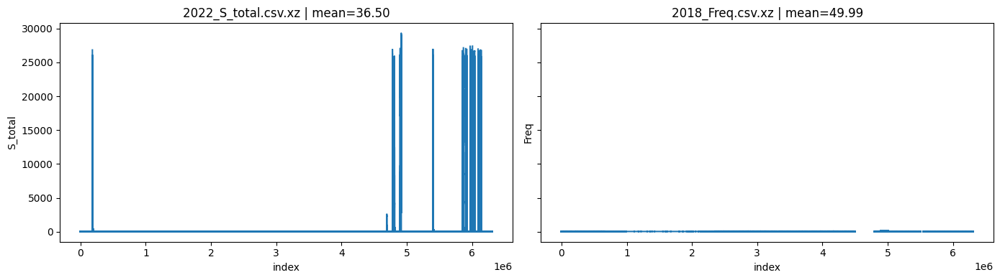

'\nD:\\EnergyDataset\\dataset_clean\\EPI_HighTempOven\\S_total\x822_S_total.csv.xz\nD:\\EnergyDataset\\dataset_clean\\EPI_HighTempOven\\S1\x822_S1.csv.xz;\nD:\\EnergyDataset\\dataset_clean\\EPI_HighTempOven\\S2\x822_S2.csv.xz;\nD:\\EnergyDataset\\dataset_clean\\EPI_HighTempOven\\S3\x822_S3.csv.xz   \n\n'

In [31]:
import os
import pandas as pd
import matplotlib.pyplot as plt

def plot_pair_side_by_side(path_left: str, path_right: str) -> None:
    # Load
    df_l = pd.read_csv(path_left, compression="xz")
    df_r = pd.read_csv(path_right, compression="xz")

    # Detect optional time column and parse
    time_like = {"time","timestamp","date","datetime","ts","Time","Timestamp","Date","Datetime"}
    tcol_l = next((c for c in df_l.columns if c in time_like), None)
    tcol_r = next((c for c in df_r.columns if c in time_like), None)
    if tcol_l is not None:
        df_l[tcol_l] = pd.to_datetime(df_l[tcol_l], errors="coerce")
    if tcol_r is not None:
        df_r[tcol_r] = pd.to_datetime(df_r[tcol_r], errors="coerce")

    # First numeric non-time column
    valcol_l = next(c for c in df_l.columns if pd.api.types.is_numeric_dtype(df_l[c]) and c not in time_like)
    valcol_r = next(c for c in df_r.columns if pd.api.types.is_numeric_dtype(df_r[c]) and c not in time_like)

    # X values (time if present, else index)
    x_l = df_l[tcol_l] if tcol_l is not None else df_l.index
    x_r = df_r[tcol_r] if tcol_r is not None else df_r.index

    # Means (2 decimals)
    mean_l = pd.to_numeric(df_l[valcol_l], errors="coerce").mean()
    mean_r = pd.to_numeric(df_r[valcol_r], errors="coerce").mean()

    # Plot with shared axes
    fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharex=True, sharey=True)
    axes[0].plot(x_l, df_l[valcol_l])
    axes[0].set_title(f"{os.path.basename(path_left)} | mean={mean_l:.2f}")
    axes[0].set_xlabel("time" if tcol_l is not None else "index")
    axes[0].set_ylabel(valcol_l)

    axes[1].plot(x_r, df_r[valcol_r])
    axes[1].set_title(f"{os.path.basename(path_right)} | mean={mean_r:.2f}")
    axes[1].set_xlabel("time" if tcol_r is not None else "index")
    axes[1].set_ylabel(valcol_r)

    fig.tight_layout()
    plt.show()
            
# --- Example (commented out) ---
plot_pair_side_by_side(
    r"D:\EnergyDataset\dataset_clean\EPI_ChipPress\S_total\2022_S_total.csv.xz",
    r"D:\EnergyDataset\dataset_clean\EPI_ChipPress\Freq\2018_Freq.csv.xz"
)

"""


"""


In [32]:
df = pd.read_csv(r"D:\EnergyDataset\dataset_clean\EPI_ChipPress\Freq\2018_Freq.csv.xz")
df

,WsDateTime,Freq
0,2018-01-01 00:00:00,49.98
1,2018-01-01 00:00:05,49.97
2,2018-01-01 00:00:10,49.96
3,2018-01-01 00:00:15,49.96
4,2018-01-01 00:00:20,49.96
...,...,...
6307195,2018-12-31 23:59:35,NaN
6307196,2018-12-31 23:59:40,NaN
6307197,2018-12-31 23:59:45,NaN
6307198,2018-12-31 23:59:50,NaN


In [36]:
from pathlib import Path
from typing import List

def delete_backups(dry_run: bool = False) -> List[Path]:
    """
    Delete all files containing '.bak_' under:
      ../dataset_clean and ../dataset_clean_validation

    A match must:
      - be a file,
      - contain '.bak_' in the filename,
      - NOT end with '.csv' or '.xz'.

    If dry_run=True, it only prints what would be deleted.
    Returns the list of deleted (or would-be-deleted) file paths.
    """
    base_dirs = [Path("../dataset_clean"), Path("../dataset_clean_validation")]
    targets: List[Path] = []

    for base in base_dirs:
        if not base.exists():
            continue
        for p in base.rglob("*"):
            if p.is_file():
                name = p.name
                if ".bak_" in name and not (name.endswith(".csv") or name.endswith(".xz")):
                    targets.append(p.resolve())

    # Sort for stable output
    targets.sort()

    for p in targets:
        if dry_run:
            print(f"[DRY RUN] Would delete: {p}")
        else:
            try:
                p.unlink()
                print(f"Deleted: {p}")
            except Exception as e:
                print(f"FAILED to delete: {p}  ({e})")

    return targets

# Example:
# delete_backups()          # actually delete
delete_backups(dry_run=False)  # preview only


Deleted: D:\EnergyDataset\dataset_clean_validation\EPI_ChipPress\Freq\2018_Freq_missing.csv.bak_20251012_131449
Deleted: D:\EnergyDataset\dataset_clean_validation\EPI_ChipPress\Freq\2018_Freq_stats.csv.bak_20251012_131449
Deleted: D:\EnergyDataset\dataset_clean_validation\EPI_ChipPress\Freq\2019_Freq_missing.csv.bak_20251012_131452
Deleted: D:\EnergyDataset\dataset_clean_validation\EPI_ChipPress\Freq\2019_Freq_stats.csv.bak_20251012_131452
Deleted: D:\EnergyDataset\dataset_clean_validation\EPI_ChipPress\Freq\2020_Freq_missing.csv.bak_20251012_131456
Deleted: D:\EnergyDataset\dataset_clean_validation\EPI_ChipPress\Freq\2020_Freq_stats.csv.bak_20251012_131456
Deleted: D:\EnergyDataset\dataset_clean_validation\EPI_ChipPress\Freq\2021_Freq_missing.csv.bak_20251012_131459
Deleted: D:\EnergyDataset\dataset_clean_validation\EPI_ChipPress\Freq\2021_Freq_stats.csv.bak_20251012_131459
Deleted: D:\EnergyDataset\dataset_clean_validation\EPI_ChipPress\Freq\2022_Freq_missing.csv.bak_20251012_131502


[WindowsPath('D:/EnergyDataset/dataset_clean_validation/EPI_ChipPress/Freq/2018_Freq_missing.csv.bak_20251012_131449'),
 WindowsPath('D:/EnergyDataset/dataset_clean_validation/EPI_ChipPress/Freq/2018_Freq_stats.csv.bak_20251012_131449'),
 WindowsPath('D:/EnergyDataset/dataset_clean_validation/EPI_ChipPress/Freq/2019_Freq_missing.csv.bak_20251012_131452'),
 WindowsPath('D:/EnergyDataset/dataset_clean_validation/EPI_ChipPress/Freq/2019_Freq_stats.csv.bak_20251012_131452'),
 WindowsPath('D:/EnergyDataset/dataset_clean_validation/EPI_ChipPress/Freq/2020_Freq_missing.csv.bak_20251012_131456'),
 WindowsPath('D:/EnergyDataset/dataset_clean_validation/EPI_ChipPress/Freq/2020_Freq_stats.csv.bak_20251012_131456'),
 WindowsPath('D:/EnergyDataset/dataset_clean_validation/EPI_ChipPress/Freq/2021_Freq_missing.csv.bak_20251012_131459'),
 WindowsPath('D:/EnergyDataset/dataset_clean_validation/EPI_ChipPress/Freq/2021_Freq_stats.csv.bak_20251012_131459'),
 WindowsPath('D:/EnergyDataset/dataset_clean_val